# Проект: Создание модели прогнозирования покупки в следующие 90 дней.

Интернет-магазин собирает историю покупателей, проводит рассылки предложений и планирует будущие продажи. Для оптимизации процессов надо выделить пользователей, которые готовы совершить покупку в ближайшее время (90 дней). Необходимо проанализаровать данные и создать прогнозую модель.

**План работы**

- Подготовка и анализ данных
- Обучение моделей
- Анализ моделей
- Выводы по проектам

**Для этой задачи заказчик предоставил следукющие данные:**<br>

***apparel-purchases*** - история покупок <br>
- `client_id` — идентификатор пользователя <br>
- `quantity` — количество товаров в заказе <br>
- `price` — цена товара <br>
- `category_ids` — вложенные категории, к которым отнсится товар <br>
- `date` — дата покупки <br>
- `message_id` — идентификатор сообщения из рассылки <br>

***apparel-messages*** - история рекламных рассылок <br>
- `bulk_campaign_id` — идентификатор рекламной кампании <br>
- `client_id` — идентификатор пользователя <br>
- `message_id` — идентификатор сообщений <br>
- `event` — тип действия <br>
- `channel` — канал рассылки <br>
- `date` — дата рассылки <br>
- `created_at` — точное время создания сообщения <br>

***apparel-target_binary*** - совершит ли клиент покупку в течение следующих 90 дней
- `client_id` — идентификатор пользователя <br>
- `target` — целевой признак <br>

***full_campaign_daily_event*** - агрегация общей базы рассылок по дням и типам событий
- `date` — дата <br>
- `bulk_campaign_id` — идентификатор рассылки <br>
- `count_event` — общее количество каждого события event <br>
- `nunique_event` — количество уникальных client_id в каждом событии <br>

***full_campaign_daily_event_channel*** - агрегация по дням с учетом событий и каналов рассылки
- `date` — дата <br>
- `bulk_campaign_id` — идентификатор рассылки <br>
- `count_event_channel` — общее количество каждого события по каналам <br>
- `nunique_event_channel` — количество уникальных client_id по событиям и каналам <br>

Импорт необходимых библиотек

In [3]:
try:
    from imblearn.over_sampling import SMOTE
except ModuleNotFoundError:
    !pip install imbalanced-learn -q
    from imblearn.over_sampling import SMOTE
try:
    import phik
except ModuleNotFoundError:
    !pip install phik -q
    import phik
#  устанавливаю библиотеку shap
try:
    import shap
except ModuleNotFoundError:
    !pip install shap -q
    import shap
#  устанавливаю библиотеку lightgbm
try:
    from lightgbm import LGBMRegressor
except ModuleNotFoundError:
    import subprocess
    import sys
    subprocess.check_call([sys.executable, "-m", "pip", "install", "lightgbm"])
    from lightgbm import LGBMRegressor
# Импортиую нужные для работы билиотеки
import ast
from lightgbm import LGBMRegressor, LGBMClassifier
import pandas as pd
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.pipeline import Pipeline, make_pipeline

import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter, PercentFormatter
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

from scipy import stats as st
from scipy.stats import uniform, randint, percentileofscore, mode

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.experimental import enable_iterative_imputer
from sklearn.feature_selection import SelectKBest, f_classif, VarianceThreshold, f_regression
from sklearn.inspection import permutation_importance
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso, RidgeClassifier
from sklearn.metrics import (
    classification_report, 
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score, 
    roc_auc_score, 
    mean_squared_error, 
    r2_score,
    mean_absolute_error,
    make_scorer,
    mean_squared_error
)
from sklearn.model_selection import (
    train_test_split, 
    GridSearchCV,
    RandomizedSearchCV,
    StratifiedKFold,  
    KFold,
    ParameterSampler,
    ParameterGrid,
    RandomizedSearchCV,
    cross_val_score
)
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    StandardScaler, 
    MinMaxScaler, 
    OneHotEncoder, 
    OrdinalEncoder,
    FunctionTransformer,
    PolynomialFeatures,
    LabelEncoder,
    PowerTransformer
)
from sklearn.svm import SVC, SVR
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from phik import phik_matrix, resources, report
from phik.report import plot_correlation_matrix
import time
import itertools
import warnings
warnings.filterwarnings('ignore')
# from ydata_profiling import ProfileReport
# from ydata_profiling.config import Settings

# Установка опции для отображения максимальной ширины столбца
pd.set_option('display.max_colwidth', None)

RANDOM_STATE = 42

## Подготовка и анализ данных

### Загрузка данных

In [4]:
purchases = pd.read_csv('apparel-purchases.csv')

In [5]:
messages = pd.read_csv('apparel-messages.csv')

In [6]:
target_binary = pd.read_csv('apparel-target_binary.csv')

In [7]:
full_campaign_daily_event = pd.read_csv('full_campaign_daily_event.csv')

In [8]:
full_campaign_daily_event_channel = pd.read_csv('full_campaign_daily_event_channel.csv')

In [9]:
purchases.sample(3)

,client_id,quantity,price,category_ids,date,message_id
96964,1515915625559148602,1,999.0,"['4', '28', '146', '548']",2023-03-29,1515915625559148602-11208-6423f1420943e
41761,1515915625470883759,1,66.0,"['5562', '5634', '5626', '572']",2022-11-04,1515915625470883759-7602-6364bc1f886ac
77047,1515915625582864711,1,1049.0,"['6060', '6058', '6062', '5502']",2022-12-23,1515915625897932016-8915-63a2e08c29f7c


In [10]:
messages.sample(3)

,bulk_campaign_id,client_id,message_id,event,channel,date,created_at
3046509,8605,1515915625833298705,1515915625833298705-8605-6397420dad8ee,open,mobile_push,2022-12-12,2022-12-12 15:45:57
1712907,6832,1515915625489782662,1515915625489782662-6832-6335b2fc9ae97,send,mobile_push,2022-09-29,2022-09-29 15:10:11
6177339,13486,1515915625489173850,1515915625489173850-13486-64ae94fbef8f7,send,mobile_push,2023-07-12,2023-07-12 13:53:51


In [11]:
target_binary.sample(3)

,client_id,target
31022,1515915625576877046,0
43387,1515915625810567328,0
35635,1515915625602335887,0


In [12]:
full_campaign_daily_event.sample(3)

,date,bulk_campaign_id,count_click,count_complain,count_hard_bounce,count_open,count_purchase,count_send,count_soft_bounce,count_subscribe,...,nunique_open,nunique_purchase,nunique_send,nunique_soft_bounce,nunique_subscribe,nunique_unsubscribe,count_hbq_spam,nunique_hbq_spam,count_close,nunique_close
107604,2024-02-07,13908,0,0,0,10,0,0,0,0,...,9,0,0,0,0,0,0,0,0,0
35600,2022-11-18,1378,0,0,0,2,0,0,0,0,...,2,0,0,0,0,0,0,0,0,0
69508,2023-04-23,8626,0,1,0,28,0,0,0,0,...,28,0,0,0,0,1,0,0,0,0


In [13]:
full_campaign_daily_event_channel.sample(3)

,date,bulk_campaign_id,count_click_email,count_click_mobile_push,count_open_email,count_open_mobile_push,count_purchase_email,count_purchase_mobile_push,count_soft_bounce_email,count_subscribe_email,...,count_send_email,nunique_hard_bounce_email,nunique_hbq_spam_email,nunique_send_email,count_soft_bounce_mobile_push,nunique_soft_bounce_mobile_push,count_complain_email,nunique_complain_email,count_close_mobile_push,nunique_close_mobile_push
33085,2022-11-07,4971,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
75130,2023-05-24,12684,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
58273,2023-02-19,4990,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


**Вывод по шагу 1.1:**
1. Данные загружены успешно.

### Предобработка данных

#### Вывод общей информации о массивах

In [14]:
purchases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202208 entries, 0 to 202207
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   client_id     202208 non-null  int64  
 1   quantity      202208 non-null  int64  
 2   price         202208 non-null  float64
 3   category_ids  202208 non-null  object 
 4   date          202208 non-null  object 
 5   message_id    202208 non-null  object 
dtypes: float64(1), int64(2), object(3)
memory usage: 9.3+ MB


In [15]:
purchases.describe()

,client_id,quantity,price
count,2.022080e+05,202208.000000,202208.000000
mean,1.515916e+18,1.006483,1193.301516
std,1.459458e+08,0.184384,1342.252664
min,1.515916e+18,1.000000,1.000000
25%,1.515916e+18,1.000000,352.000000
50%,1.515916e+18,1.000000,987.000000
75%,1.515916e+18,1.000000,1699.000000
max,1.515916e+18,30.000000,85499.000000


In [16]:
messages.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12739798 entries, 0 to 12739797
Data columns (total 7 columns):
 #   Column            Dtype 
---  ------            ----- 
 0   bulk_campaign_id  int64 
 1   client_id         int64 
 2   message_id        object
 3   event             object
 4   channel           object
 5   date              object
 6   created_at        object
dtypes: int64(2), object(5)
memory usage: 680.4+ MB


In [17]:
messages.describe()

,bulk_campaign_id,client_id
count,1.273980e+07,1.273980e+07
mean,1.160459e+04,1.515916e+18
std,3.259211e+03,1.329704e+08
min,5.480000e+02,1.515916e+18
25%,8.746000e+03,1.515916e+18
50%,1.351600e+04,1.515916e+18
75%,1.415800e+04,1.515916e+18
max,1.465700e+04,1.515916e+18


In [18]:
target_binary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49849 entries, 0 to 49848
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   client_id  49849 non-null  int64
 1   target     49849 non-null  int64
dtypes: int64(2)
memory usage: 779.0 KB


In [19]:
target_binary.describe()

,client_id,target
count,4.984900e+04,49849.000000
mean,1.515916e+18,0.019278
std,1.487947e+08,0.137503
min,1.515916e+18,0.000000
25%,1.515916e+18,0.000000
50%,1.515916e+18,0.000000
75%,1.515916e+18,0.000000
max,1.515916e+18,1.000000


In [20]:
full_campaign_daily_event.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131072 entries, 0 to 131071
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   date                 131072 non-null  object
 1   bulk_campaign_id     131072 non-null  int64 
 2   count_click          131072 non-null  int64 
 3   count_complain       131072 non-null  int64 
 4   count_hard_bounce    131072 non-null  int64 
 5   count_open           131072 non-null  int64 
 6   count_purchase       131072 non-null  int64 
 7   count_send           131072 non-null  int64 
 8   count_soft_bounce    131072 non-null  int64 
 9   count_subscribe      131072 non-null  int64 
 10  count_unsubscribe    131072 non-null  int64 
 11  nunique_click        131072 non-null  int64 
 12  nunique_complain     131072 non-null  int64 
 13  nunique_hard_bounce  131072 non-null  int64 
 14  nunique_open         131072 non-null  int64 
 15  nunique_purchase     131072 non-nu

In [21]:
full_campaign_daily_event.describe()

,bulk_campaign_id,count_click,count_complain,count_hard_bounce,count_open,count_purchase,count_send,count_soft_bounce,count_subscribe,count_unsubscribe,...,nunique_open,nunique_purchase,nunique_send,nunique_soft_bounce,nunique_subscribe,nunique_unsubscribe,count_hbq_spam,nunique_hbq_spam,count_close,nunique_close
count,131072.000000,131072.000000,131072.000000,131072.000000,1.310720e+05,131072.000000,1.310720e+05,131072.000000,131072.000000,131072.000000,...,1.310720e+05,131072.000000,1.310720e+05,131072.000000,131072.000000,131072.000000,131072.000000,131072.000000,131072.000000,131072.000000
mean,8416.743378,90.982971,0.932655,78.473434,3.771091e+03,0.577927,1.163414e+04,27.807312,0.140518,6.362679,...,3.683000e+03,0.465103,1.153716e+04,27.573799,0.134125,5.960602,0.810364,0.809799,0.000008,0.000008
std,4877.369306,1275.503564,30.198326,1961.317826,6.516067e+04,9.107040,1.757095e+05,736.944714,2.072777,79.172069,...,6.258647e+04,7.126368,1.727005e+05,734.050700,1.976439,73.284148,183.298579,183.298245,0.002762,0.002762
min,548.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4116.000000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,...,1.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7477.000000,0.000000,0.000000,0.000000,6.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,...,6.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,13732.000000,2.000000,0.000000,0.000000,3.000000e+01,0.000000,0.000000e+00,0.000000,0.000000,1.000000,...,3.000000e+01,0.000000,0.000000e+00,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,15150.000000,128453.000000,5160.000000,287404.000000,5.076151e+06,1077.000000,1.154351e+07,76284.000000,189.000000,9089.000000,...,2.922440e+06,779.000000,7.094600e+06,76281.000000,177.000000,8299.000000,63920.000000,63920.000000,1.000000,1.000000


In [22]:
full_campaign_daily_event_channel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131072 entries, 0 to 131071
Data columns (total 36 columns):
 #   Column                           Non-Null Count   Dtype 
---  ------                           --------------   ----- 
 0   date                             131072 non-null  object
 1   bulk_campaign_id                 131072 non-null  int64 
 2   count_click_email                131072 non-null  int64 
 3   count_click_mobile_push          131072 non-null  int64 
 4   count_open_email                 131072 non-null  int64 
 5   count_open_mobile_push           131072 non-null  int64 
 6   count_purchase_email             131072 non-null  int64 
 7   count_purchase_mobile_push       131072 non-null  int64 
 8   count_soft_bounce_email          131072 non-null  int64 
 9   count_subscribe_email            131072 non-null  int64 
 10  count_unsubscribe_email          131072 non-null  int64 
 11  nunique_click_email              131072 non-null  int64 
 12  nunique_click_mo

In [23]:
full_campaign_daily_event_channel.describe()

,bulk_campaign_id,count_click_email,count_click_mobile_push,count_open_email,count_open_mobile_push,count_purchase_email,count_purchase_mobile_push,count_soft_bounce_email,count_subscribe_email,count_unsubscribe_email,...,count_send_email,nunique_hard_bounce_email,nunique_hbq_spam_email,nunique_send_email,count_soft_bounce_mobile_push,nunique_soft_bounce_mobile_push,count_complain_email,nunique_complain_email,count_close_mobile_push,nunique_close_mobile_push
count,131072.000000,131072.000000,131072.000000,1.310720e+05,1.310720e+05,131072.000000,131072.000000,131072.000000,131072.000000,131072.000000,...,1.310720e+05,131072.000000,131072.000000,1.310720e+05,131072.000000,131072.000000,131072.000000,131072.000000,131072.000000,131072.000000
mean,8416.743378,41.582169,49.400803,4.237060e+02,3.347385e+03,0.357483,0.220444,24.474823,0.140518,6.362679,...,4.189581e+03,18.535683,0.809799,4.186898e+03,3.332489,3.311653,0.932655,0.921326,0.000008,0.000008
std,4877.369306,745.484035,1036.952898,9.753384e+03,6.444859e+04,8.287483,3.796500,727.069387,2.072777,79.172069,...,1.073198e+05,1349.473695,183.298245,1.072618e+05,120.916269,120.094858,30.198326,29.715170,0.002762,0.002762
min,548.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4116.000000,0.000000,0.000000,1.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7477.000000,0.000000,0.000000,5.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,13732.000000,1.000000,0.000000,2.300000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,15150.000000,59365.000000,128453.000000,2.597015e+06,5.076151e+06,1077.000000,431.000000,76284.000000,189.000000,9089.000000,...,7.094600e+06,287341.000000,63920.000000,7.094600e+06,21831.000000,21389.000000,5160.000000,5043.000000,1.000000,1.000000


#### Оставляю в массивах только тех покупателей, для которых есть значение таргета

In [24]:
# Перечень id покупателей с таргетом
clients_with_target = set(target_binary['client_id'])
len(clients_with_target)

49849

имеется 50 тысяч покупателей с тагретом

In [25]:
purchases_filtered = purchases.query('client_id in @clients_with_target')
len(set(purchases_filtered['client_id']))

49849

In [26]:
messages_filtered = messages.query('client_id in @clients_with_target')
len(set(messages_filtered['client_id']))

41982

в сообщениях меньше покупателей, для которых определено значение таргета

#### Работа с датами

**Задание правильных типов столбцов для столбцов с датами**

In [27]:
# Тип дата
for col in ['date', 'created_at']:
    messages_filtered[col]=pd.to_datetime(messages_filtered[col])

purchases['date']=pd.to_datetime(purchases['date'])
purchases_filtered['date']=pd.to_datetime(purchases_filtered['date'])
full_campaign_daily_event['date']=pd.to_datetime(full_campaign_daily_event['date'])
full_campaign_daily_event_channel['date']=pd.to_datetime(full_campaign_daily_event_channel['date'])

In [28]:
purchases_filtered[['date']].dtypes

date    datetime64[ns]
dtype: object

In [29]:
purchases[['date']].dtypes

date    datetime64[ns]
dtype: object

In [30]:
messages_filtered[['date', 'created_at']].dtypes

date          datetime64[ns]
created_at    datetime64[ns]
dtype: object

In [31]:
full_campaign_daily_event['date'].dtype

dtype('<M8[ns]')

In [32]:
full_campaign_daily_event_channel['date'].dtype

dtype('<M8[ns]')

Тип для столбцов с данными задан правильно

**Определение даты выгрузки**

In [33]:
# Ищю последнюю дату покупки - она будет датой выгрузки данных
data_export_date = purchases['date'].max()
data_export_date

Timestamp('2024-02-16 00:00:00')

#### Работа с пропусками

In [34]:
# Функция вывода доли пропущенных значений в столбцах (с подстветкой)
def missing_values_share(df):
    missing_values_share = pd.DataFrame(round(df.isna().mean()*100,)).reset_index()
    missing_values_share.columns = ['Столбец', 'Доля пропусков, %']
    return display(
        missing_values_share
        .sort_values(by='Доля пропусков, %', ascending=False)
        .style.background_gradient('coolwarm')
    )

In [35]:
df_with_names = [
    ('purchases_filtered', purchases_filtered),
    ('messages_filtered', messages_filtered),
    ('full_campaign_daily_event', full_campaign_daily_event),
    ('full_campaign_daily_event_channel', full_campaign_daily_event_channel)
]

In [36]:
for df_name, df in df_with_names:
    print(f'Пропуски в массиве {df_name}:')
    missing_values_share(df)

Пропуски в массиве purchases_filtered:


,Столбец,"Доля пропусков, %"
0,client_id,0.000000
1,quantity,0.000000
2,price,0.000000
3,category_ids,0.000000
4,date,0.000000
5,message_id,0.000000


Пропуски в массиве messages_filtered:


,Столбец,"Доля пропусков, %"
0,bulk_campaign_id,0.000000
1,client_id,0.000000
2,message_id,0.000000
3,event,0.000000
4,channel,0.000000
5,date,0.000000
6,created_at,0.000000


Пропуски в массиве full_campaign_daily_event:


,Столбец,"Доля пропусков, %"
0,date,0.000000
1,bulk_campaign_id,0.000000
22,count_close,0.000000
21,nunique_hbq_spam,0.000000
20,count_hbq_spam,0.000000
19,nunique_unsubscribe,0.000000
18,nunique_subscribe,0.000000
17,nunique_soft_bounce,0.000000
16,nunique_send,0.000000
15,nunique_purchase,0.000000


Пропуски в массиве full_campaign_daily_event_channel:


,Столбец,"Доля пропусков, %"
0,date,0.000000
1,bulk_campaign_id,0.000000
20,count_hard_bounce_mobile_push,0.000000
21,count_send_mobile_push,0.000000
22,nunique_hard_bounce_mobile_push,0.000000
23,nunique_send_mobile_push,0.000000
24,count_hard_bounce_email,0.000000
25,count_hbq_spam_email,0.000000
26,count_send_email,0.000000
27,nunique_hard_bounce_email,0.000000


Пропущенных значений в массивах нет

#### Работа с явными дубликатами

In [37]:
def obv_duplicates(data, array_name):
    """
    Создаю функцию, которая для всех текстовых данных массива убирает пробелы в начале и конце строки,
    переводит буквы в нижний регистр и далее проверяет массив на наличие явных дубликатов.

    Parameters:
    data (DataFrame): Входной DataFrame для обработки.
    array_name : Имя массива.

    Returns:
    None
    """
        
    # Для всех текстовых данных убираю пробелы в начале и конце строки, перевожу буквы в нижний регистр
    # for col in data.columns:
    #     if data[col].dtype == 'object':
    #         data.loc[:, col] = data[col].str.strip().str.lower()    
    # Проверяю есть ли явные дубликаты строк
    obvious_duplicates_qty = data.duplicated(keep='first').sum()
    obvious_duplicates_share = 100*obvious_duplicates_qty / len(data)
    if obvious_duplicates_qty != 0:
        print(f"В массиве '{array_name}' количество явных дубликатов строк = {obvious_duplicates_qty}({obvious_duplicates_share:.2f}%).")
        display(data[data.duplicated()])
    else:
        print(f"Явные дубликаты строк в массиве '{array_name}' отсутствуют.")

In [38]:
# Применяю функцию к массивам
for df_name, df in df_with_names:
    obv_duplicates(df,  df_name)

В массиве 'purchases_filtered' количество явных дубликатов строк = 73020(36.11%).


,client_id,quantity,price,category_ids,date,message_id
12,1515915625491869271,2,599.0,"['4', '27', '350', '1392']",2022-05-16,1515915625491869271-2090-61a72488d6a0f
22,1515915625566606509,1,299.0,"['5562', '5634', '5579', '710']",2022-05-16,1515915625566606509-4301-627b66245401d
42,1515915625468070175,1,2199.0,"['4', '27', '142', '496']",2022-05-17,1515915625468070175-4439-6283414668daa
59,1515915625468126078,1,1499.0,"['4', '28', '275', '421']",2022-05-17,1515915625468126078-4439-6283411f7c0cc
62,1515915625468141317,1,49.0,"['4', '27', '38', '481']",2022-05-17,1515915625468141317-4439-6283412e01078
...,...,...,...,...,...,...
202200,1515915626010261344,1,1499.0,"['2', '18', '212', '726']",2024-02-16,1515915626010261344-14648-65cdb6d56c4c8
202201,1515915626010261344,1,1499.0,"['2', '18', '212', '726']",2024-02-16,1515915626010261344-14648-65cdb6d56c4c8
202202,1515915626010261344,1,1499.0,"['2', '18', '212', '726']",2024-02-16,1515915626010261344-14648-65cdb6d56c4c8
202203,1515915626010261344,1,1499.0,"['2', '18', '212', '726']",2024-02-16,1515915626010261344-14648-65cdb6d56c4c8


В массиве 'messages_filtered' количество явных дубликатов строк = 37724(0.34%).


,bulk_campaign_id,client_id,message_id,event,channel,date,created_at
964232,5723,1515915625554535987,1515915625554535987-5723-62e2af08e00da,click,mobile_push,2022-07-28,2022-07-28 15:58:56
966466,5723,1515915625483569932,1515915625483569932-5723-62e2af0790ad5,click,mobile_push,2022-07-28,2022-07-28 16:07:12
967282,5723,1515915625736038297,1515915625736038297-5723-62e2af0a17cba,click,mobile_push,2022-07-28,2022-07-28 16:09:56
967567,5723,1515915625753898206,1515915625753898206-5723-62e2af0a21ecd,click,mobile_push,2022-07-28,2022-07-28 16:12:24
967904,5723,1515915625626349443,1515915625626349443-5723-62e2af09c0fd3,click,mobile_push,2022-07-28,2022-07-28 16:15:02
...,...,...,...,...,...,...,...
12739453,14641,1515915625488250415,1515915625488250415-14641-65cb246c645d7,open,email,2024-02-15,2024-02-15 16:57:19
12739558,14657,1515915625566604535,1515915625566604535-14657-65cdd3746b1d9,open,email,2024-02-15,2024-02-15 18:20:59
12739720,14600,1515915625468103375,1515915625468103375-14600-65c2038646d16,click,mobile_push,2024-02-15,2024-02-15 21:52:00
12739722,14607,1515915625468103375,1515915625468103375-14607-65c33b1f402bb,click,mobile_push,2024-02-15,2024-02-15 21:52:00


Явные дубликаты строк в массиве 'full_campaign_daily_event' отсутствуют.
Явные дубликаты строк в массиве 'full_campaign_daily_event_channel' отсутствуют.


1. В массиве `purchases_filtered` дубликатов 36% - возможно это из-за того, что каждая штука каждой позиции в заказе учитывалась как отдельный заказ, поэтому все эти записи важны. id заказов у нас нет, поэтому проверить эту гипотезу нельзя. Исходя из этого лучше эти дубликаты не удалять.
2. В массиве `messages_filtered`, картина другая - дубликаты сообщений совпадают по дате создания до секунд, поэтому их точно можно удалить.

In [39]:
# удаление явных дубликатов
messages_filtered = messages_filtered.copy().drop_duplicates(keep='last')
# проверка
obv_duplicates(messages_filtered, 'messages')

Явные дубликаты строк в массиве 'messages' отсутствуют.


#### Обработка структуры категорий в массиве `purchases_filtered`

In [40]:
# Перевожу структуры категорий в списки
purchases_filtered['category_ids'] = purchases_filtered['category_ids'].apply(ast.literal_eval)

In [41]:
purchases_filtered['category_ids'].sample(5)

29364      [5562, 5631, 5549, 735]
115749    [5562, 5631, 5608, 1327]
36022            [2, 18, 212, 658]
42950      [5562, 5631, 5593, 675]
12734            [4, 28, 239, 418]
Name: category_ids, dtype: object

**Создаю массив с уникальными цепочками структуры**

In [42]:
# Отбираю уникальные цепоки и сортирую их по возрастанию
products = pd.DataFrame(data=purchases_filtered['category_ids'].apply(str).unique(), columns=['tree']).sort_values(by='tree').reset_index(drop=True)

In [43]:
len(products)

933

Уникальных цепочек - 933 шт

In [44]:
products.tail(5)

,tree
928,"['6060', '6059', '6071', '6292']"
929,"['6060', '6059', '6072', '1853']"
930,"['6060', '6059', '6076', '1153']"
931,[None]
932,[]


Убираю пустые значения

In [45]:
products_filtered = products.iloc[:-2]
products_filtered.tail()

,tree
926,"['6060', '6059', '6071', '5746']"
927,"['6060', '6059', '6071', '5756']"
928,"['6060', '6059', '6071', '6292']"
929,"['6060', '6059', '6072', '1853']"
930,"['6060', '6059', '6076', '1153']"


Определяю как распределены количества уровней иерархии

In [46]:
# Добавляю столбец с количеством уровней
products_filtered['tree']= products_filtered['tree'].apply(ast.literal_eval)
products_filtered['len'] = products_filtered['tree'].apply(len)

In [47]:
# Делаю свод
products_filtered['len'].value_counts()

len
4    908
3     22
5      1
Name: count, dtype: int64

Большая часть продуктов имеет **4 уровня** иерархии категорий

**Определяю уровень категории, до которого можно спуститься**

Так как одинаковые категории могут встречаться в разных ветках иерархии. то для агреггирования продуктов нужно остановиться на уровне иерархии, ниже которого есть повторения категорий из текущего.

Варианты работы с иерархией категорий
1. Взять только первые значения - это будет либо первый уровень категории, либо распродажа, либо маркер пола.
2. Посмотреть количества значений первых и вторых позиций - возможно будут видны маркеры распродаж и пола. Тогда их можно будет отделиь и оставить только настоящий верхний уровень.

Остановлюсь пока на первом варианте.

In [48]:
# Создаю колонку с продуктами в массиве purchases
purchases_filtered['products']=purchases_filtered['category_ids'].apply(
    lambda x: x[0] if isinstance(x, list) and len(x) > 0  and x!=[None] else 'Unknown_product'
)
purchases_filtered['products'].value_counts()

products
4                  112578
5562                46511
2                   27429
6060                 7559
Unknown_product      6843
5963                 1272
3                      11
1                       3
5                       2
Name: count, dtype: int64

**В массиве purchases создал новый признак - `products`.**

### Агрегирование покупок и создание новых признаков

#### Добавляю выручку каждому покупателю

In [49]:
# Добавляю столбец revenue
purchases_filtered['revenue'] = purchases_filtered['quantity'] * purchases_filtered['price']

In [50]:
# Сумма купленных продуктов по каждому продукту для каждого клиента
product_summary = (
    purchases_filtered.groupby(["client_id", "products"])["quantity"]
    .sum()
    .unstack(fill_value=0)
)

In [51]:
# Общая выручка по каждому покупателю
customer_revenue = purchases_filtered.groupby("client_id")["revenue"].sum()

#### Добавлю количество активных дней с покупками для каждого покупателя

In [52]:
# Удаляем дублирующиеся покупки в один день
purchases_filtered_duplicates = purchases_filtered.drop_duplicates(subset=['client_id', 'date'])

# Считаем количество активных дней для каждого клиента
purchases_active_days = purchases_filtered_duplicates.groupby('client_id')['date'].count()
purchases_active_days.sample(2)

client_id
1515915625500467697    1
1515915625578776673    1
Name: date, dtype: int64

In [53]:
purchases_active_days.describe()

count    49849.000000
mean         1.207808
std          0.665728
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         41.000000
Name: date, dtype: float64

#### Добавляю количество активных дней года

Количество активных дней для каждого покупателя для каждого месяца последнего полного года в данных

In [54]:
# Определим последний полный год
last_full_year = purchases_filtered_duplicates['date'].dt.year.max() - 1
last_full_year

2023

In [55]:
# Отфильтруем данные для последнего полного года
filtered_data = purchases_filtered_duplicates[
    purchases_filtered_duplicates['date'].dt.year == last_full_year
]

In [56]:
# Добавим столбец с номером месяца
filtered_data['month'] = filtered_data['date'].dt.month

In [57]:
# Группировка по client_id и месяцу
monthly_purchases = (
    filtered_data
    .groupby(['client_id', 'month'])
    .size()
    .reset_index(name='purchase_count')
)

In [58]:
# Переходим к широкой таблице
monthly_purchases = monthly_purchases.pivot(index='client_id', columns='month', values='purchase_count')

# Переименуем колонки в формат month_N
monthly_purchases.columns = [f'{last_full_year}_month_{col}' for col in monthly_purchases.columns]

# Заполним пропуски нулями
monthly_purchases = monthly_purchases.fillna(0).astype(int)

In [59]:
monthly_purchases.sample(1)

,2023_month_1,2023_month_2,2023_month_3,2023_month_4,2023_month_5,2023_month_6,2023_month_7,2023_month_8,2023_month_9,2023_month_10,2023_month_11,2023_month_12
client_id,,,,,,,,,,,,
1515915625991407781,0,0,0,0,0,0,0,0,0,0,0,1


**Добавляю количество дней с последней покупки**

In [60]:
# Количество дней с последней покупки для каждого покупателя
last_purchase_date = purchases_filtered.groupby("client_id")["date"].max()
days_since_last_purchase = (data_export_date - last_purchase_date).dt.days

#### Добавляю количество купленных товаров в праздничные дни

In [61]:
# Даты первой и последней покупок в массиве
print(f'Первая покупка: {purchases_filtered['date'].min()}')
print(f'Последняя покупка: {data_export_date}')

Первая покупка: 2022-05-16 00:00:00
Последняя покупка: 2024-02-16 00:00:00


In [62]:
# Список праздничных периодов
holiday_periods = [
    ('2022-06-11', '2022-06-13'), # День России 
    ('2022-11-04', '2022-11-06'), # День народного единства
    ('2022-11-21', '2022-11-27'), # черная пятница    
    ('2022-12-26', '2022-12-31'), # Новый год         
    ('2023-01-01', '2023-01-08'), # Новый год и рождество
    ('2023-02-07', '2023-02-14'), # День св. Валентина
    ('2023-02-20', '2023-02-26'), # День защитника отечества
    ('2023-03-01', '2023-03-08'), # Межд. женский день
    ('2023-04-29', '2023-05-14'), # Праздник Весны и Труда, День Победы
    ('2023-06-10', '2023-06-12'), # День России
    ('2023-11-04', '2023-11-06'), # День народного единства
    ('2023-11-20', '2023-11-26'), # черная пятница 
    ('2023-12-25', '2023-12-31'), # Новый год
    ('2024-01-01', '2024-01-08'), # Новый год и рождество
    ('2024-02-07', '2024-02-14')  # День св. Валентина
]

# Конвертируем периоды в формат datetime
holiday_periods = [(pd.to_datetime(start), pd.to_datetime(end)) for start, end in holiday_periods]

In [63]:
# Функция для проверки, попадает ли дата в праздничный период
def is_holiday(date):
    for start, end in holiday_periods:
        if start <= date <= end:
            return 1
    return 0

In [64]:
# Применяем функцию ко всем датам
purchases_filtered['is_holiday_purchase'] = purchases_filtered['date'].apply(is_holiday)

# Учитываем только покупки, сделанные в праздничный период
holiday_purchases = purchases_filtered[purchases_filtered['is_holiday_purchase'] == 1]

In [65]:
# Считаем общее количество купленных товаров по клиентам
holiday_quantity_per_client = holiday_purchases.groupby('client_id')['quantity'].sum().reset_index()
holiday_quantity_per_client.rename(columns={'quantity': 'holiday_quantity'}, inplace=True)

In [66]:
# Если у клиента нет покупок в праздники, добавляем 0
all_clients = pd.DataFrame({'client_id': purchases_filtered['client_id'].unique()})
holiday_quantity = all_clients.merge(holiday_quantity_per_client, on='client_id', how='left')
holiday_quantity['holiday_quantity'] = holiday_quantity['holiday_quantity'].fillna(0).astype(int)

In [67]:
holiday_quantity.sample()

,client_id,holiday_quantity
8795,1515915625566602379,0


#### Объединяю результаты

In [68]:
# Объединяем результаты
result = pd.DataFrame({
    "total_revenue": customer_revenue,
    "days_since_last_purchase": days_since_last_purchase,
}).join(product_summary)

result = result.merge(purchases_active_days, how='left', on='client_id').rename(columns={'date':'active_days'})
# result = result.merge(monthly_purchases, how='left', on='client_id').rename(columns={'date':'active_days'})
# - отказался от этого варианта так как ROC-AUC хуже получается
result = result.merge(holiday_quantity, how='left', on='client_id')

result.sample(2)

,client_id,total_revenue,days_since_last_purchase,1,2,3,4,5,5562,5963,6060,Unknown_product,active_days,holiday_quantity
14347,1515915625490613454,5592.0,54,0,0,0,6,0,5,0,0,0,1,0
41351,1515915625766079923,2598.0,421,0,0,0,0,0,2,0,0,0,1,0


#### Добавляю среднюю сумму покупок в активный день

In [69]:
result['avg_purchase'] = result['total_revenue'] / result['active_days']

### Агрегирование сообщений

#### Проверяю корректность мэппинга сообщений с id клиента

Заметил, что в массивах message_id начинается со значения client_id - проверю есть ли не совпадения и удалю их

In [70]:
# Функция для корректности мэппинга сообщений с id клиента
def filter_dataframe(df, col1, col2): 
    """ 
    Фильтрует строки в DataFrame, оставляя только те, где значения col2 начинаются с текста col1. 
    Выводит отчёт о количестве удалённых строк и проценте удалённых строк от общего количества. 
 
    Parameters: 
    df (pd.DataFrame): Исходный DataFrame. 
    col1 (str): Название первого текстового столбца. 
    col2 (str): Название второго текстового столбца. 
 
    Returns: 
    pd.DataFrame: Отфильтрованный DataFrame. 
    """ 
    initial_count = len(df) 
    filtered_df = df[df.apply(lambda row: str(row[col2]).startswith(str(row[col1])), axis=1)] 
    final_count = len(filtered_df) 
    removed_count = initial_count - final_count 
    removed_percentage = (removed_count / initial_count) * 100 
 
    print(f"Удалено записей: {removed_count}") 
    print(f"Процент удалённых записей: {removed_percentage:.2f}%") 
 
    return filtered_df

In [71]:
messages_filtered = filter_dataframe(messages_filtered, "client_id", "message_id") 

Удалено записей: 0
Процент удалённых записей: 0.00%


Несовпадений не обнаружено

#### Агрегирую данные

In [72]:
# Посмотрим на события для каждого сообщения
messages_filtered['event'].value_counts()

event
send           7898997
open           2485299
click           443970
purchase         55704
hard_bounce      16366
soft_bounce       8915
unsubscribe       2614
hbq_spam           760
complain           495
subscribe           76
close                1
Name: count, dtype: int64

**Расшифровка категорий событий для сообщений рассылки**

| Событие         | Описание                                                                 |
|------------------|--------------------------------------------------------------------------|
| **send**         | Сообщение было отправлено получателю. Маркер писем, которые система успешно отправила. |
| **open**         | Сообщение было открыто получателем. Это фиксируется, если в письме есть специальный трекинговый пиксель (изображение), который загружается при просмотре. |
| **click**        | Получатель кликнул на ссылку в сообщении. Это показатель вовлеченности, отражающий интерес к содержимому письма. |
| **purchase**     | Получатель совершил покупку в результате взаимодействия с письмом (обычно через клик на ссылку). Это ключевой показатель эффективности для коммерческих рассылок. |
| **hard_bounce**  | Сообщение не было доставлено из-за постоянной ошибки, например, адрес получателя недействителен. Эти адреса обычно исключают из базы. |
| **soft_bounce**  | Сообщение не было доставлено из-за временной ошибки, например, переполнен почтовый ящик получателя или сервер временно недоступен. Сообщение может быть повторно отправлено позже. |
| **unsubscribe**  | Получатель отписался от рассылки. Это происходит, когда пользователь нажимает на ссылку для отказа от писем. |
| **hbq_spam**     | Сообщение было помечено как спам на уровне фильтрации сервера (например, SpamAssassin). HBQ может означать конкретный алгоритм или механизм фильтрации. |
| **complain**     | Получатель пометил сообщение как спам в своем почтовом клиенте. Это негативный сигнал, который может повлиять на репутацию отправителя. |
| **subscribe**    | Получатель подписался на рассылку. Это событие может возникнуть, если подписка была оформлена через письмо или форму. |
| **close**        | Редкий или специфический сценарий, возможно, связанный с завершением сессии или взаимодействия с письмом. Если встречается только 1 раз, это может быть тестовый случай или ошибка. |

**Отфильтрую сообщения с негативными событиями - `unsubscribe`, `hbq_spam`, `hard_bounce`, `soft_bounce`, `complain`, `close`**

In [73]:
# Перечень негативных событий
negative_events = ['unsubscribe', 'hbq_spam', 'hard_bounce', 'soft_bounce', 'complain', 'close']

In [74]:
# Получаем множество message_id сообщений с негативными событиями
negative_events_messages = set(messages_filtered.query('event in @negative_events')['message_id'])
len(negative_events_messages)

28696

In [75]:
# Убираю сообщения с негативными событиями
messages_filtered = messages_filtered.query('message_id not in @negative_events_messages')
messages_filtered.shape

(10851719, 7)

**Разворачиваю messages по типам события**

In [76]:
# Разворачиваем таблицу
messages_events = messages_filtered.pivot_table(index=['bulk_campaign_id', 'client_id', 'message_id', 'channel'],
                                              columns='event', 
                                              aggfunc='size',
                                              fill_value=0
                                             ).reset_index()

# Убираем MultiIndex в столбцах
messages_events.columns.name = None  # Убираем имя столбца
messages_events = messages_events.rename_axis(None, axis=1)  # Убираем индексацию

In [77]:
# Вывод результата
messages_events.sample(2)

,bulk_campaign_id,client_id,message_id,channel,click,open,purchase,send,subscribe
7539023,14567,1515915625558168980,1515915625558168980-14567-65b8bed8ba05f,mobile_push,0,1,0,1,0
1507846,7803,1515915625541156942,1515915625541156942-7803-636dfed846abb,email,0,0,0,1,0


In [78]:
# Преобразование channel в индикаторные столбцы
messages_channels_dummies = pd.get_dummies(messages_events['channel'], prefix='channel')

# Соединение индикаторных колонок с основным DataFrame
messages_events = pd.concat([messages_events.drop(columns=['channel']), messages_channels_dummies], axis=1)

In [79]:
messages_events.sample(2)

,bulk_campaign_id,client_id,message_id,click,open,purchase,send,subscribe,channel_email,channel_mobile_push
1429119,7602,1515915625489046841,1515915625489046841-7602-6364bc1b5e87d,0,0,0,1,0,True,False
1755364,8222,1515915625491798606,1515915625491798606-8222-6384bb6d25578,0,0,0,1,0,False,True


**Агреггирую статистику для каждого клиента**

In [80]:
# Подсчет метрик для каждого клиента
result_messages = messages_events.groupby("client_id").agg(
    # total_messages=("message_id", "nunique"),
    total_clicks=("click", "sum"),
    total_open=("open", "sum"),
    total_purchase=("purchase", "sum"),
    total_send=("send", "sum"),
    total_subscribe=("subscribe", "sum"),
    messages_email=("channel_email", "sum"),
    messages_mobile_push=("channel_mobile_push", "sum"),
    unique_campaigns=("bulk_campaign_id", "nunique")
).reset_index()
result_messages.sample(2)

,client_id,total_clicks,total_open,total_purchase,total_send,total_subscribe,messages_email,messages_mobile_push,unique_campaigns
9684,1515915625489105241,1,13,1,187,0,115,72,186
20740,1515915625511934114,6,141,1,252,0,114,138,246


In [81]:
result_messages.describe()

,client_id,total_clicks,total_open,total_purchase,total_send,total_subscribe,messages_email,messages_mobile_push,unique_campaigns
count,4.193300e+04,41933.000000,41933.000000,41933.000000,41933.000000,41933.000000,41933.000000,41933.000000,41933.000000
mean,1.515916e+18,10.570720,59.183841,1.324017,187.708487,0.000024,86.307347,101.454749,185.833282
std,1.486341e+08,13.790087,73.376262,1.308589,104.434638,0.004883,66.949983,97.229764,103.308743
min,1.515916e+18,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,1.515916e+18,3.000000,4.000000,1.000000,115.000000,0.000000,7.000000,0.000000,114.000000
50%,1.515916e+18,6.000000,26.000000,1.000000,175.000000,0.000000,98.000000,88.000000,173.000000
75%,1.515916e+18,13.000000,94.000000,1.000000,259.000000,0.000000,142.000000,181.000000,256.000000
max,1.515916e+18,380.000000,1266.000000,81.000000,2471.000000,1.000000,320.000000,2152.000000,2463.000000


#### Добавляю произвадение открытых на все полученные сообщениям

In [82]:
result_messages['open_mult_send'] = result_messages['total_open']*result_messages['total_send']

### Объединяю аггрегированные даные по покупкам и сообщениям

In [83]:
result_final = result.merge(result_messages, how='left', on='client_id')

In [84]:
result_final.sample(2)

,client_id,total_revenue,days_since_last_purchase,1,2,3,4,5,5562,5963,...,avg_purchase,total_clicks,total_open,total_purchase,total_send,total_subscribe,messages_email,messages_mobile_push,unique_campaigns,open_mult_send
28144,1515915625559966328,909.0,251,0,0,0,1,0,0,0,...,909.0,1.0,98.0,0.0,287.0,0.0,184.0,103.0,281.0,28126.0
8009,1515915625488369439,6198.0,632,0,0,0,2,0,0,0,...,6198.0,2.0,3.0,1.0,18.0,0.0,18.0,0.0,18.0,54.0


In [85]:
result_final.sample()

,client_id,total_revenue,days_since_last_purchase,1,2,3,4,5,5562,5963,...,avg_purchase,total_clicks,total_open,total_purchase,total_send,total_subscribe,messages_email,messages_mobile_push,unique_campaigns,open_mult_send
7971,1515915625488354688,2296.0,421,0,0,0,0,0,4,0,...,1148.0,14.0,24.0,2.0,219.0,0.0,219.0,0.0,219.0,5256.0


### Перевожу client_id в индекс

In [86]:
# Проверим совпадают ли id клиента
set(result_final['client_id'])-set(target_binary['client_id'])

set()

In [87]:
result_final.set_index('client_id', inplace=True)

In [88]:
result_final.sample(2)

,total_revenue,days_since_last_purchase,1,2,3,4,5,5562,5963,6060,...,avg_purchase,total_clicks,total_open,total_purchase,total_send,total_subscribe,messages_email,messages_mobile_push,unique_campaigns,open_mult_send
client_id,,,,,,,,,,,,,,,,,,,,,
1515915625488373485,980.0,287,0,0,0,0,0,2,0,0,...,980.0,22.0,159.0,1.0,299.0,0.0,137.0,162.0,296.0,47541.0
1515915625475113281,8818.0,462,0,0,0,0,0,4,0,0,...,8818.0,3.0,5.0,1.0,48.0,0.0,48.0,0.0,48.0,240.0


In [89]:
target_binary.set_index('client_id', inplace=True)

In [90]:
target_binary.sample(2)

,target
client_id,
1515915625501243348,0
1515915625711254123,0


Перевожу все категориальные столбцы в тип `category`

In [91]:
# # Вычисление размера памяти мегабайтах до изменений
# memory_in_megabytes = autos_cleaned.memory_usage(deep=True).sum() / (1024 ** 2)
# print(f'{memory_in_megabytes:.2f}')

In [92]:
# for col in cat_cols_dict['autos_cleaned'].to_list():
#     autos_cleaned[col]=autos_cleaned[col].astype('category')

In [93]:
# autos_cleaned.describe()

Меняю разрядность для числовых столбцов:
- Price - int16
- RegistrationYear - int16
- Power - int16
- Kilometer - int32
- RegistrationMonth - int8
- PostalCode - int32

In [94]:
# for col in ['Price', 'RegistrationYear', 'Power']:
#     autos_cleaned[col]=autos_cleaned[col].astype('int16')

# autos_cleaned['Kilometer']=autos_cleaned['Kilometer'].astype('int32')
# autos_cleaned['PostalCode']=autos_cleaned['PostalCode'].astype('int32')
#autos_cleaned['RegistrationMonth']=autos_cleaned['RegistrationMonth'].astype('int8')

In [95]:
# Вычисление размера памяти мегабайтах до изменений
# memory_in_megabytes = autos_cleaned.memory_usage(deep=True).sum() / (1024 ** 2)
# print(f'{memory_in_megabytes:.2f}')

Размер массива уменьшен до 11 Мб

### Анализ данных

In [96]:
result_final = result_final.merge(target_binary, how='left', on='client_id')

In [97]:
result_final['target'] = result_final['target'].astype('bool')

In [98]:
# Отображаю статистики
display(result_final.describe().T)

,count,mean,std,min,25%,50%,75%,max
total_revenue,49849.0,4865.584264,7351.467229,1.0,1499.0,2969.0,5698.0,540408.0
days_since_last_purchase,49849.0,361.931593,185.301691,0.0,233.0,348.0,542.0,641.0
1,49849.0,0.000060,0.007758,0.0,0.0,0.0,0.0,1.0
2,49849.0,0.552468,1.673767,0.0,0.0,0.0,0.0,62.0
3,49849.0,0.000221,0.020524,0.0,0.0,0.0,0.0,2.0
4,49849.0,2.268932,3.781811,0.0,0.0,1.0,3.0,218.0
5,49849.0,0.000040,0.008958,0.0,0.0,0.0,0.0,2.0
5562,49849.0,0.943630,3.214717,0.0,0.0,0.0,0.0,199.0
5963,49849.0,0.025617,0.310449,0.0,0.0,0.0,0.0,28.0
6060,49849.0,0.154466,1.156025,0.0,0.0,0.0,0.0,73.0


In [99]:
#
result_final['target'].value_counts(normalize=True)

target
False    0.980722
True     0.019278
Name: proportion, dtype: float64

Классы сильно несбалансированы, на первый класс приходиться менее 0.02% данных

#### Построение pairplot

Чтобы ускорить работу графики буду строить по выборкам 1/5 от всех данных

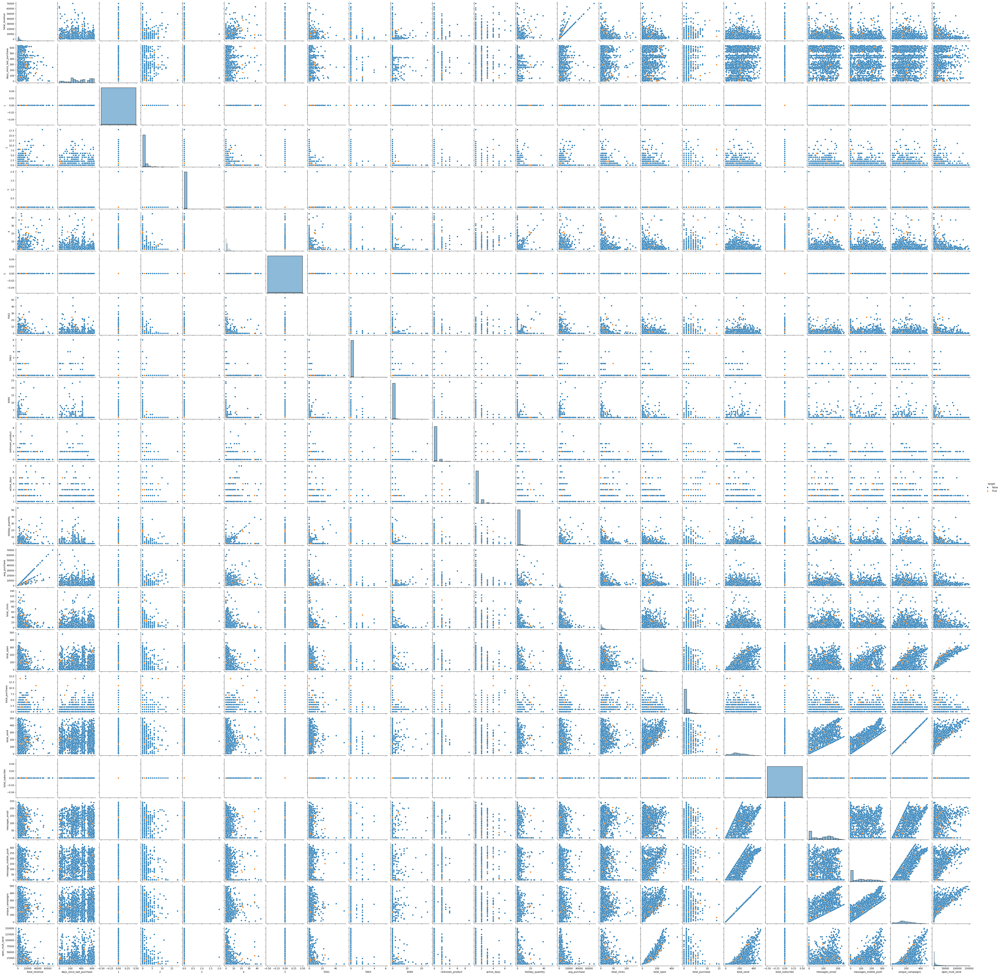

In [100]:
# Построение pairplot с гистограммами на диагонали
pairplot = sns.pairplot(result_final.sample(frac=0.05, random_state=RANDOM_STATE), hue='target',diag_kind='hist')

In [101]:
# Сохраняю в отдельный файл, чтобы лучше рассмотреть результат
pairplot.savefig('pairplot.jpeg', format='jpeg', dpi=300)

#### Построение гистограмм

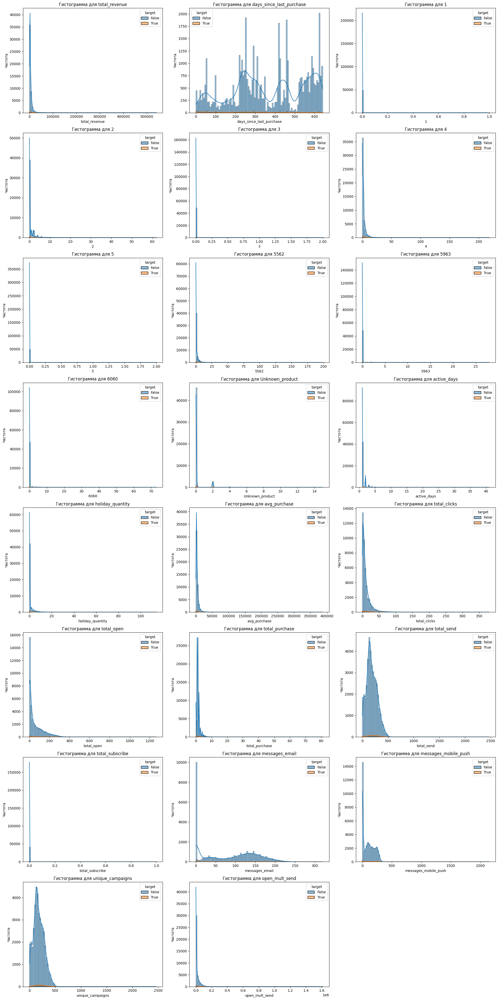

In [102]:
# Строю гистограммы отдельно
# Получаем список всех числовых колонок
numeric_columns = result_final.select_dtypes(include=[np.number]).columns

# Определяем количество строк и колонок для отображения
n_cols = 3  # 3 графика в строке
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols  # Рассчитываем количество строк

# Создаем подграфики
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axes = axes.flatten()  # Выравниваем массив осей для удобного перебора

# Строим гистограммы
for i, column in enumerate(numeric_columns):
    sns.histplot(data=result_final, x=column, hue='target', kde=True, bins=100, ax=axes[i])
    axes[i].set_title(f'Гистограмма для {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Частота')

# Удаляем лишние оси
for j in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[j])  # Удаляем неиспользуемые подграфики

plt.tight_layout()  # Упорядочиваем графики
plt.show()

На диаграммах видны группы значений у признаков `days_since_last_purchase`, `active_days`, `messages_mobile_push`, `messages_email`. Добавлю категориальные признаки с группами, возможно они будут лучше работать в модели чем исходные.

**Разобью количество дней с последней покупки на группы**

Гистограмма признака `days_since_last_purchase` явно делит выборку на 4 группы:<br>

| Группа  | Диапазон `days_since_last_purchase` |
|---------|----------------------------------|
| group_1 | 0-150                            |
| group_2 | 150-370                          |
| group_3 | 370-500                          |
| group_4 | >500                             |<br>


In [103]:
# Добавим новый признак
def days_since_last_purhase_group(days_since_last_purchase):
    if days_since_last_purchase <= 150:
        return '1_low'
    if days_since_last_purchase <= 370:
        return '2_medium'
    if days_since_last_purchase <= 500:
        return '3_high'
    return '4_very_high' 
 
result_final['days_since_last_purchase_group'] = result_final['days_since_last_purchase'].apply(days_since_last_purhase_group)
result_final['days_since_last_purchase_group'] = pd.Categorical(result_final['days_since_last_purchase_group'], ordered=True)
result_final['days_since_last_purchase_group'].cat.categories

Index(['1_low', '2_medium', '3_high', '4_very_high'], dtype='object')

#### Разобью количество активных дней на группы

Выделю в отдельную группу покупателeй, у которых больше одного активного дня

In [104]:
# Добавим новый признак
def active_days_group(active_days):
    if active_days <= 1:
        return '1_one'
    return '2_multiple'
 
result_final['active_days_group'] = result_final['active_days'].apply(active_days_group)
result_final['active_days_group'] = pd.Categorical(result_final['active_days_group'], ordered=True)
result_final['active_days_group'].cat.categories

Index(['1_one', '2_multiple'], dtype='object')

#### Разобью группы покупателей с сообщениями по смс

<Axes: >

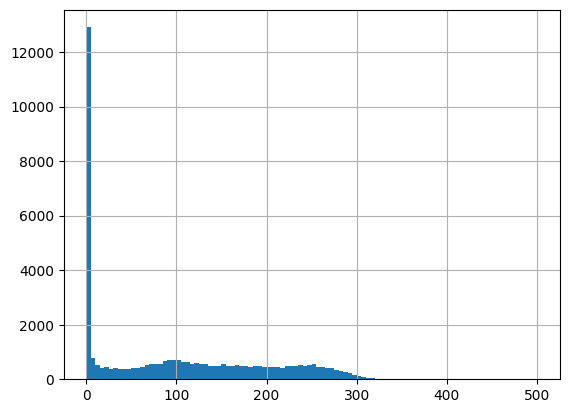

In [105]:
result_final['messages_mobile_push'].hist(bins=100, range=(0,500))

In [106]:
# Добавим новый признак
def messages_mobile_push_group(messages_mobile_push):
    if messages_mobile_push <= 10:
        return '1_low'
    if messages_mobile_push <= 300:
        return '2_medium'
    return '3_high'
 
result_final['messages_mobile_push_group'] = result_final['messages_mobile_push'].apply(messages_mobile_push_group)
result_final['messages_mobile_push_group'] = pd.Categorical(result_final['messages_mobile_push_group'], ordered=True)
result_final['messages_mobile_push_group'].cat.categories

Index(['1_low', '2_medium', '3_high'], dtype='object')

#### Разобью группы покупателей по количеству e-mail

<Axes: >

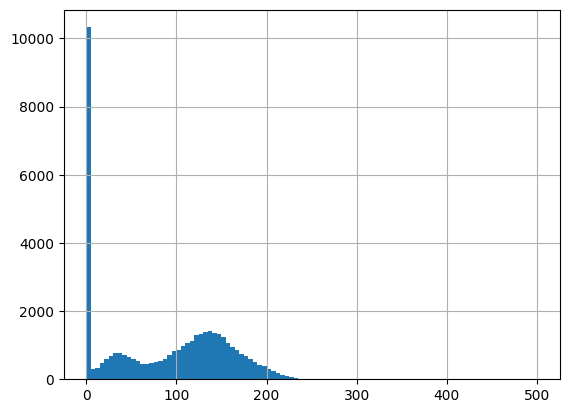

In [107]:
result_final['messages_email'].hist(bins=100, range=(0,500))

In [108]:
# Добавим новый признак
def messages_email_group(messages_email):
    if messages_email <= 1:
        return '1_low'
    if messages_email <= 60:
        return '2_medium'
    if messages_email <= 230:
        return '3_high'    
    return '4_very_high'
 
result_final['messages_email_group'] = result_final['messages_email'].apply(messages_email_group)
result_final['messages_email_group'] = pd.Categorical(result_final['messages_email_group'], ordered=True)
result_final['messages_email_group'].cat.categories

Index(['1_low', '2_medium', '3_high', '4_very_high'], dtype='object')

#### Сортирую колонки по алфавиту и переношу таргет в конце списка колонок

In [109]:
# Сортировка колонок в алфавитном порядке, кроме 'target'
sorted_columns = sorted([col for col in result_final.columns if col != 'target']) + ['target']
result_final = result_final[sorted_columns]

#### Построение диаграмм размаха

In [110]:
def plot_boxplots(data):
    """
    Строит диаграммы размаха для всех числовых столбцов массива данных, группируя по значениям категориальных столбцов.

    Parameters:
    data (pd.DataFrame): Массив данных.

    Returns:
    None
    """
    # categorical_columns = data.select_dtypes(exclude=[np.number]).columns.to_list()
    categorical_columns = ['target']
    numerical_columns = data.select_dtypes(include=[np.number]).columns.to_list()
    
    for cat_col in categorical_columns:
        num_plots = len(numerical_columns)
        num_rows = (num_plots+4) // 4  # Количество строк для размещения по 4 графика в ряд
        
        fig, axs = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))
        axs = axs.flatten()
        
        for i, col in enumerate(numerical_columns):
            with warnings.catch_warnings():
                warnings.simplefilter(action='ignore', category=FutureWarning)
                sns.boxplot(x=cat_col, y=col, data=data, ax=axs[i], showfliers=False)
            
            axs[i].set_title(f'Диаграмма размаха для\nпризнака "{col}"\nпо категориям\nпризнака"{cat_col}"')
            axs[i].set_xlabel(cat_col)
            axs[i].set_ylabel(col)
            axs[i].tick_params(axis='x', rotation=45)
        
        # Удаляю пустые подграфики
        for j in range(num_plots, num_rows * 4):
            fig.delaxes(axs[j])
        
        plt.tight_layout()
        sns.despine()
        plt.show()

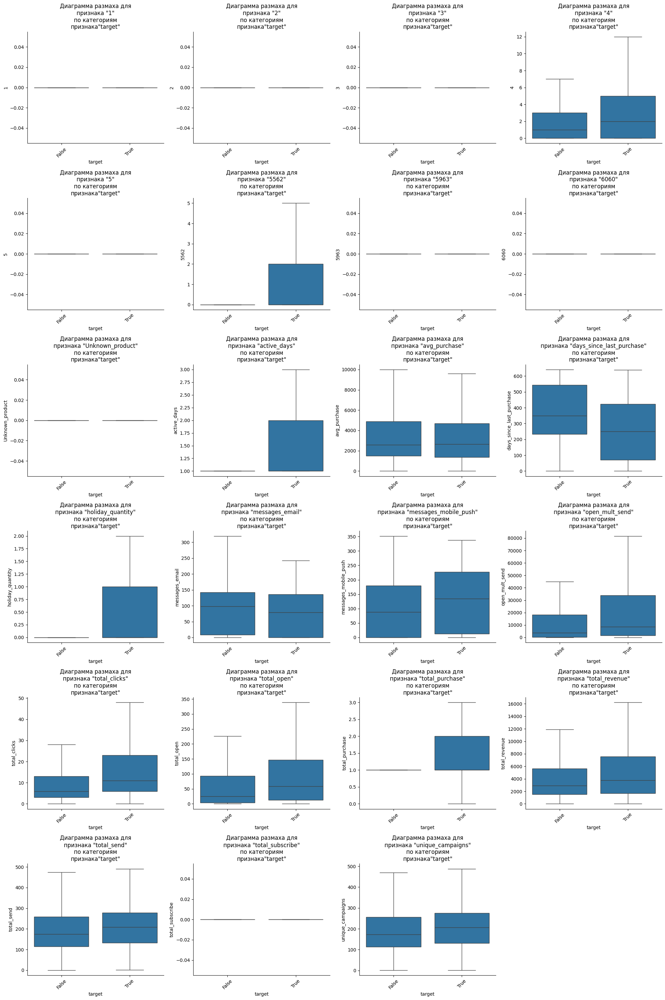

In [111]:
plot_boxplots(result_final)

Из диаграмм размаха видны признаки с различиями медиан и размахов значений по таргету:
- 'total_revenue'
- 'days_since_last_purchase'
- '4'
- '5562'
- 'active_days'
- 'holiday_quantity'
- 'total_clicks'
- 'total_open'
- 'total_purchase'
- 'messages_email'
- 'messages_mobile_push'
- 'open_mult_send'

#### Построение тепловых карт

In [112]:
# Создаю функцию построения тепловых карт для всех пар категориальных столбцов массива данных

def plot_categorical_heatmaps(data):
    categorical_columns = data.select_dtypes(include=['object', 'category', 'bool']).columns.to_list()
    num_cols = 3  # Количество графиков в строке
    num_pairs = len(categorical_columns) * (len(categorical_columns) - 1) // 2
    num_rows = (num_pairs + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 8 * num_rows))
    axes = axes.flatten()
    
    pair_idx = 0
    for col1, col2 in itertools.combinations(categorical_columns, 2):
        cross_tab = pd.crosstab(data[col1], data[col2])
        cross_tab_percent = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100
        
        # Создаю аннотаци с количеством и процентом
        annotations = cross_tab.astype(str) + "\n(" + cross_tab_percent.round(1).astype(str) + "%)"
        
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            sns.heatmap(cross_tab, annot=annotations, fmt="", cmap="YlGnBu", ax=axes[pair_idx], cbar=False)
        
        axes[pair_idx].set_title(
            f'Число покупателей\nдля "{col1}" и "{col2}"\n(число покупателей и % от категории в строчке)'
        )
        axes[pair_idx].set_xlabel(col2)
        axes[pair_idx].set_ylabel(col1)
        axes[pair_idx].tick_params(axis='y', rotation=0)
        pair_idx += 1
    
    # Удаляю пустые подграфики
    for i in range(pair_idx, len(axes)):
        fig.delaxes(axes[i])

    # Добавляю цветовую шкалу
    cbar_ax = fig.add_axes([0.1, 0.05, 0.8, 0.02])
    cbar = fig.colorbar(axes[0].collections[0], cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Число клиентов')

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        plt.tight_layout(rect=[0, 0.1, 1, 0.95])  # Оставляю пространство для шкалы
    plt.show()

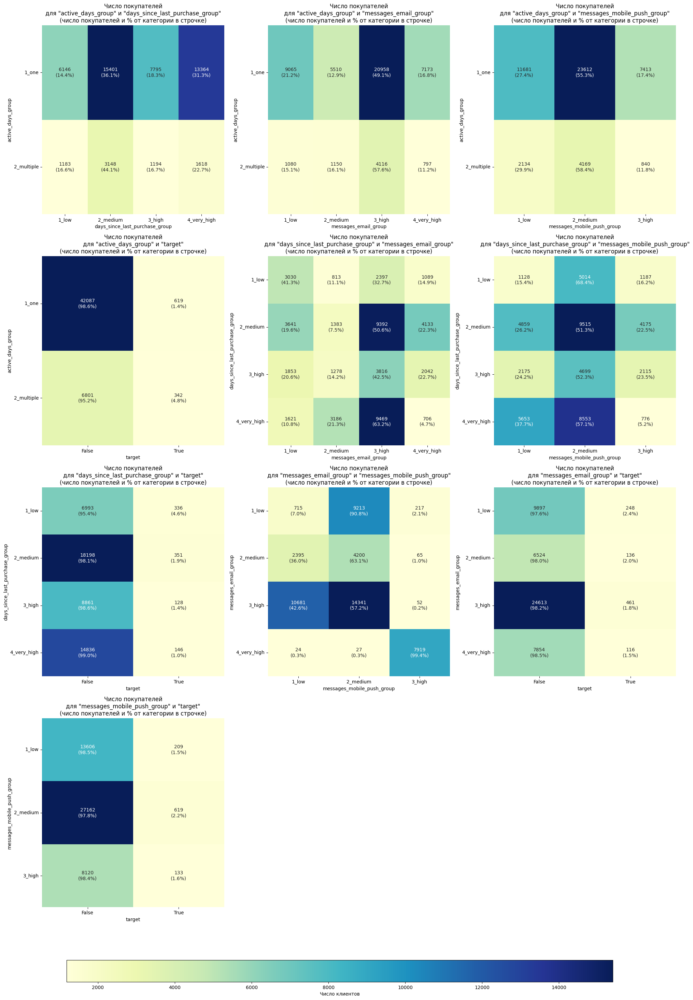

In [113]:
plot_categorical_heatmaps(result_final)

Из тепловых карт видно, что:
- покупатели с таргетом `True` имеют большую долю недавних покупок в своей группе (35%) по сравнению с покупателями с тагретом `False` (14%)
- доля покупателей с кол-вом активных дней с покупками больше одного у покупателей с тагретом `True` больше чем у покупателей с тагретом `False`, 36% против 14%

#### Построение phi кореляций

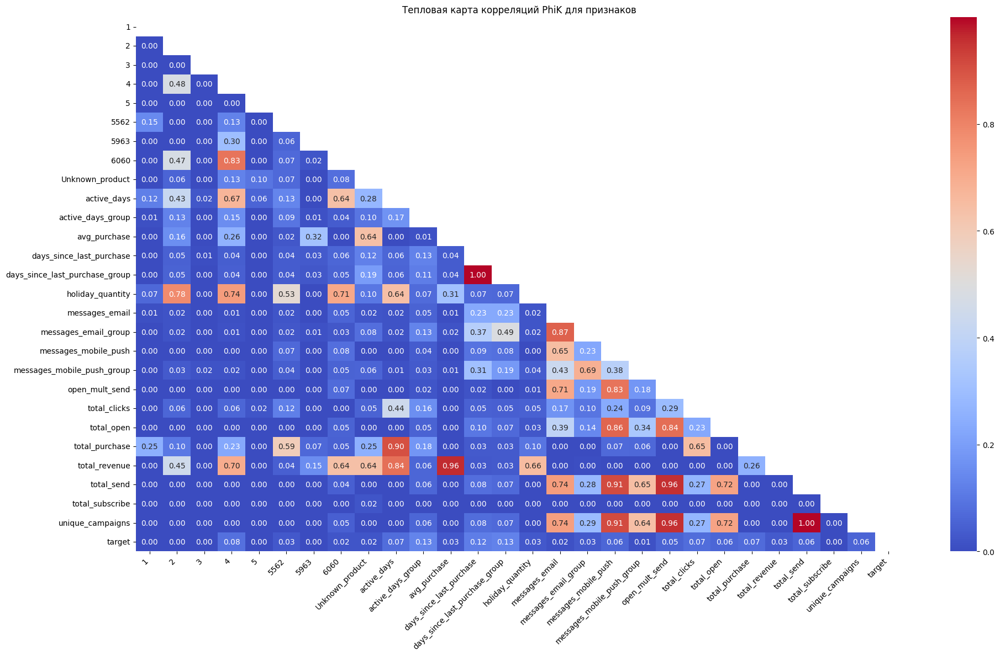

In [114]:
# Так как числовые признаки имеют не нормлаьное распределение и есть категориальные признаки
# строю тепловую карту корреляций PhiK

# Создаю список интервальных (числовых) переменных массива ferma_copy
numeric_features = result_final.select_dtypes(include=[np.number]).columns.to_list()

# Формирую и отображаю матрицу PhiK
phik_matrix = result_final.phik_matrix(interval_cols=numeric_features)
plt.figure(figsize=(20, 12))
plt.title(f"Тепловая карта корреляций PhiK для признаков")
mask = np.triu(np.ones_like(phik_matrix, dtype=bool))
heatmap = sns.heatmap(phik_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f")
heatmap.set_ylabel('')
# Поворот меток оси X на 45 градусов
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Исходя из данных матрицы отобрал следующие признаки для включения в модель - критерий отсуствие мультиколинеарности между признаками (кореляция менее 0.96, из двух выбираю признак с большей кореляцией к таргету). 
Отбор остальных признаков проанализирую в пайплайне.

In [144]:
# Признаки для включения в модель
features_to_model = [
 '1',
 '2',
 '3',
 '4',
 '5',
 '5562',
 '5963',
 '6060',
 'Unknown_product',
 'active_days',
 'active_days_group',
 # 'avg_purchase',
 # 'days_since_last_purchase',
 'days_since_last_purchase_group',
 'holiday_quantity',
 # 'messages_email',
 'messages_email_group',
 'messages_mobile_push',
 # 'messages_mobile_push_group',
 # 'open_mult_send',
 'total_clicks',
 'total_open',
 'total_purchase',
 'total_revenue',
 # 'total_send',
 'total_subscribe',
 # 'unique_campaigns',
 'target'
]

1. Числовые признаки
   - Распределение цены близкое к логнормальному - преимущественно продаются дешевые машины
   - Основная масса машин имеет возраст от 10 до 16 лет
   - В основном продаются мащины с мощностью до 200 л.с.
   - Месяц регистрации имеет почти равномерное распределение
   - Большая часть машин имеет пробег 150 тыс.км.
   - Все выгрузки были сделаны до мая, выгружали примерно равными частями
   - При этом объявления создавались в основном марте и апреле 2016, а пик просмотров приходится на последние даты выгрузок (с 3 по 7 апреля 2016.
2. Категориальные признаки
   - 50% всех машин это седаны и маленькие машины
   - 78% машин с ручной коробкой передач, 20 с автоматической
   - 12% машин это фольксваген polo и golf
   - 93% машин работают на бензине
   - 22% машин фольксваген, 11% опель, 11% БМВ, 9 мерседес бенц, 9% ауди
   - 75% машин не битые, 10% машин восстановленные
   - пропуски (заменены на no information) в VehicleType в основном относятся к машинам, зарегистрированным в 2016 году
   - цена для всех типов машин имеет тендецию к уменьшению с уменьшением мощности двигателя
   - машины с ручной коробкой передач в основном имеют более низкую мощность двигателя
3. Сильные корреляции $\phi_k$
   -  С целевым признаком `Price` у признаков: `RegistrationYear`(0.7), `Model`(0.6), `Power`(0.5)
   -  Признак `Brand` удален из-за из-за мультиколлинеарности с признаком `Model` (1.0)

## Обучение моделей

### Разделение на обучающую и тестовую выборки

In [145]:
# Отделение целевого признака
X = result_final[features_to_model].drop(['target'], axis=1)
y = target_binary

In [146]:
# Разделение на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [147]:
# Отфильтрую выбросы

In [148]:
# X_train = X_train.merge(y_train, on='client_id', how='left')

In [149]:
# X_train = X_train.query('total_revenue < 16000 and total_open < 350 and total_clicks < 60')

In [150]:
# y_train = X_train['target']

In [151]:
# Выделение числовых и категориальных признаков
numeric_features = X.select_dtypes(include=[np.number]).columns.to_list()
categorical_features = X.select_dtypes(exclude=[np.number, 'category']).columns.to_list()
ordinal_features = X.select_dtypes(include=['category']).columns.to_list()

### Создание трансформеров

In [152]:
# Трансформер для числовых признаков
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Заполняем пропуски модой
    ('scaler', MinMaxScaler())                   # Масштабируем
])

# Трансформер для категориальных признаков
categorical_transformer = Pipeline(steps=[
   ('imputer', SimpleImputer(strategy='constant', fill_value='unknown')),  # Заменяем пропуски на 'unknown'
   ('ohe', OneHotEncoder(handle_unknown='ignore'))
])

# Трансформер для порядковых категорий
ordinal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Заполняем пропуски модой
    ('ordinal', OrdinalEncoder())  # Кодируем по порядку
])


# Трансформер для бинарных признаков
#binary_transformer = Pipeline(steps=[
#    ('imputer', SimpleImputer(strategy='most_frequent'))  # Заполняем модой (чаще всего встречающимся значением)
#])

# Комбинация трансформеров
preprocessor = ColumnTransformer(
    transformers=[
       ('num', numeric_transformer, numeric_features),
       ('cat', categorical_transformer, categorical_features),
       ('ord', ordinal_transformer, ordinal_features) 
#        ('bin', binary_transformer, binary_features)
    ],
    remainder='passthrough'
)

### Обучение моделей с использованием пайплайна

#### Определение модели и пайплайна

In [153]:
# Определение модели и пайплайна

def train_and_evaluate_model(model, param_distributions, X_train, y_train):
    """
    Тренирует модель с помощью RandomizedSearchCV и оценивает её по метрике roc_auc.

    Параметры:
        model: Модель, которая будет обучена.
        param_distributions: Словарь или список, содержащий гиперпараметры для поиска.
        X_train: Признаки тренировочного набора.
        y_train: Целевые метки тренировочного набора.

    Возвращает:
        best_params: Лучшая комбинация гиперпараметров.
        train_time: Время обучения в секундах.
        roc_auc_cv: Среднее значение roc_auc на кросс-валидации.
        best_model: Лучшая модель.
    """
    # Создание пайплайна
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('feature_selection', SelectKBest(score_func=f_classif, k=15)),
                               ('model', model)])
    
    # Подбор гиперпараметров с помощью RandomizedSearchCV
    random_search = RandomizedSearchCV(
        pipeline, 
        param_distributions=param_distributions, 
        n_iter=min(len(list(ParameterGrid(param_distributions))), 10),  # Количество комбинаций гиперпараметров
        cv=5, 
        scoring='roc_auc',  # Используем метрику ROC-AUC
        n_jobs=-1,
        random_state=42
    )
    
    # Засекаем время обучения
    start_time = time.time()
    random_search.fit(X_train, y_train)
    train_time = time.time() - start_time
    
    # Оценка модели на кросс-валидации
    best_model = random_search.best_estimator_
    cv_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='roc_auc')
    roc_auc_cv = cv_scores.mean()
    
    return random_search.best_params_, train_time, roc_auc_cv, best_model

#### Параметры и запуск обучения моделей

**LightGBM**

In [154]:
# Функция для обучения LightGBM
def LightGBM(X_train, y_train, X_test, y_test):
    # Параметры для LightGBM
    lgbm_model = LGBMClassifier()
    lgbm_params = {
        'model__num_leaves': [31, 50],
        'model__learning_rate': [0.01, 0.1, 0.05],
        'model__n_estimators': [100, 150],
        'model__is_unbalance': [True],
        'model__objective': ['binary']
    }
    
    # Выполнение подбора параметров и оценка на кросс-валидации
    lgbm_best_params, lgbm_train_time, lgbm_roc_auc_cv, best_lgbm_model = train_and_evaluate_model(
        lgbm_model, lgbm_params, X_train, y_train
    )
    
    print("LightGBM - выбор гиперпараметров")
    print("Best Params:", lgbm_best_params)
    print("Train Time:", lgbm_train_time)
    print("ROC-AUC (Cross-Validation):", lgbm_roc_auc_cv)
    
    # Окончательное тестирование на тестовой выборке
    start_time = time.time()
    y_pred = best_lgbm_model.predict(X_test)
    y_pred_proba = best_lgbm_model.predict_proba(X_test)[:, 1]  # Вероятности для класса 1
    lgbm_predict_time = time.time() - start_time
    lgbm_roc_auc_test = roc_auc_score(y_test, y_pred_proba)
    lgbm_f1_test = f1_score(y_test, y_pred)

    print("Final Test Evaluation")
    print("Predict Time:", lgbm_predict_time)
    print("ROC-AUC (Test):", lgbm_roc_auc_test)
    print("f1 (Test):", lgbm_f1_test)
    
    return lgbm_best_params, lgbm_train_time, lgbm_roc_auc_cv, best_lgbm_model, lgbm_predict_time, lgbm_roc_auc_test, lgbm_f1_test

In [155]:
lgbm_best_params, lgbm_train_time, lgbm_roc_auc_cv, best_lgbm_model, lgbm_predict_time, lgbm_roc_auc_test, lgbm_f1_test = LightGBM(X_train, y_train, X_test, y_test)

[LightGBM] [Info] Number of positive: 769, number of negative: 39110
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1127
[LightGBM] [Info] Number of data points in the train set: 39879, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.019283 -> initscore=-3.929042
[LightGBM] [Info] Start training from score -3.929042
[LightGBM] [Info] Number of positive: 615, number of negative: 31288
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1111
[LightGBM] [Info] Number of data points in the train set: 31903, number of used features: 15
[LightGBM] [Info] [bin

**RandomForestClassifier**

In [156]:
# Функция для обучения RandomForestRegressor
def RandomForestClassif(X_train, y_train, X_test, y_test):
    # Модель и параметры для RandomForestClassifier
    rf_model = RandomForestClassifier(class_weight='balanced')
    rf_params = {
        'model__n_estimators': [100, 150],
        'model__max_depth': [2, 10, 15],
        'model__min_samples_split': [2, 5, 10, 100, 150]
    }
    # Выполнение подбора параметров и оценка на кросс-валидации
    rf_best_params, rf_train_time, rf_roc_auc_cv, best_rf_model = train_and_evaluate_model(
        rf_model, rf_params, X_train, y_train
    )
    print("Random Forest Classifier - выбор гиперпараметров")
    print("Best Params:", rf_best_params)
    print("Train Time:", rf_train_time)
    print("ROC-AUC (Cross-Validation):", rf_roc_auc_cv)
    
    # Окончательное тестирование на тестовой выборке
    start_time = time.time()
    y_pred = best_rf_model.predict(X_test)
    y_pred_proba = best_rf_model.predict_proba(X_test)[:, 1]  # Вероятности для класса 1
    rf_predict_time = time.time() - start_time
    rf_roc_auc_test = roc_auc_score(y_test, y_pred_proba)
    rf_f1_test = f1_score(y_test, y_pred)

    print("Final Test Evaluation")
    print("Predict Time:", rf_predict_time)
    print("ROC-AUC (Test):", rf_roc_auc_test)
    print("f1 (Test):", rf_f1_test)

    return rf_best_params, rf_train_time, rf_roc_auc_cv, best_rf_model, rf_predict_time, rf_roc_auc_test, rf_f1_test

In [157]:
rf_best_params, rf_train_time, rf_roc_auc_cv, best_rf_model, rf_predict_time, rf_roc_auc_test, rf_f1_test = RandomForestClassif(X_train, y_train, X_test, y_test)

Random Forest Classifier - выбор гиперпараметров
Best Params: {'model__n_estimators': 100, 'model__min_samples_split': 150, 'model__max_depth': 15}
Train Time: 19.58401083946228
ROC-AUC (Cross-Validation): 0.7291637744023174
Final Test Evaluation
Predict Time: 0.14121603965759277
ROC-AUC (Test): 0.7370052669257516
f1 (Test): 0.13255360623781676


**LogisticRegression**

In [158]:
# Функция для обучения LogisticRegression
def LogReg(X_train, y_train, X_test, y_test):
    # Определяем модель и параметры
    logreg_model = LogisticRegression(solver='liblinear', class_weight='balanced', max_iter=1000)  # solver='liblinear' оптимизирует задачу бинарной классификации напрямую
    logreg_params = {
        'model__penalty': ['l1', 'l2'],  # Регуляризация L1 и L2
        'model__C': [0.01, 0.1, 1, 10]   # Коэффициент регуляризации
    }

    # Обучение и подбор параметров
    logreg_best_params, logreg_train_time, logreg_roc_auc_cv, best_logreg_model = train_and_evaluate_model(
        logreg_model, logreg_params, X_train, y_train
    )

    print("Logistic Regression - выбор гиперпараметров")
    print("Best Params:", logreg_best_params)
    print("Train Time:", logreg_train_time)
    print("ROC-AUC (Cross-Validation):", logreg_roc_auc_cv)

    # Окончательное тестирование на тестовой выборке
    start_time = time.time()
    y_pred = best_logreg_model.predict(X_test)
    y_pred_proba = best_logreg_model.predict_proba(X_test)[:, 1]  # Вероятности для класса 1
    logreg_predict_time = time.time() - start_time
    logreg_roc_auc_test = roc_auc_score(y_test, y_pred_proba)
    logreg_f1_test = f1_score(y_test, y_pred)

    print("Final Test Evaluation")
    print("Predict Time:", logreg_predict_time)
    print("ROC-AUC (Test):", logreg_roc_auc_test)
    print("f1 (Test):", logreg_f1_test)

    return logreg_best_params, logreg_train_time, logreg_roc_auc_cv, best_logreg_model, logreg_predict_time, logreg_roc_auc_test, logreg_f1_test

In [159]:
logreg_best_params, logreg_train_time, logreg_roc_auc_cv, best_logreg_model, logreg_predict_time, logreg_roc_auc_test, logreg_f1_test = LogReg(X_train, y_train, X_test, y_test)

Logistic Regression - выбор гиперпараметров
Best Params: {'model__penalty': 'l2', 'model__C': 10}
Train Time: 2.988976001739502
ROC-AUC (Cross-Validation): 0.7293927117347486
Final Test Evaluation
Predict Time: 0.021825790405273438
ROC-AUC (Test): 0.7400446154632849
f1 (Test): 0.08255659121171771


**SVC** - убрал эту модель, слишком долго

In [160]:
# def SVCModel(X_train, y_train, X_test, y_test):
#     # Определяем модель и параметры
#     svc_model = SVC(probability=True, class_weight='balanced')  # SVC с расчетом вероятностей
#     svc_params = {
#         'model__C': [0.01, 0.1, 1, 10],    # Коэффициент регуляризации
#         'model__kernel': ['linear', 'rbf'] # Тип ядра: линейное или гауссовое
#     }

#     # Обучение и подбор параметров
#     svc_best_params, svc_train_time, svc_roc_auc_cv, best_svc_model = train_and_evaluate_model(
#         svc_model, svc_params, X_train, y_train
#     )

#     print("SVC - выбор гиперпараметров")
#     print("Best Params:", svc_best_params)
#     print("Train Time:", svc_train_time)
#     print("ROC-AUC (Cross-Validation):", svc_roc_auc_cv)

#     # Окончательное тестирование на тестовой выборке
#     start_time = time.time()
#     y_pred = best_svc_model.predict(X_test)
#     y_pred_proba = best_svc_model.predict_proba(X_test)[:, 1]  # Вероятности для класса 1
#     svc_predict_time = time.time() - start_time
#     svc_roc_auc_test = roc_auc_score(y_test, y_pred_proba)
#     svc_f1_test = f1_score(y_test, y_pred)

#     print("Final Test Evaluation")
#     print("Predict Time:", svc_predict_time)
#     print("ROC-AUC (Test):", svc_roc_auc_test)
#     print("f1 (Test):", svc_f1_test)

#     return svc_best_params, svc_train_time, svc_roc_auc_cv, best_svc_model, svc_predict_time, svc_roc_auc_test, svc_f1_test

In [161]:
# svc_best_params, svc_train_time, svc_roc_auc_cv, best_svc_model, svc_predict_time, svc_roc_auc_test, svc_f1_test = SVCModel(X_train, y_train, X_test, y_test)

**CatBoost**

In [163]:
from catboost import CatBoostClassifier
from sklearn.metrics import roc_auc_score, f1_score
import time

# Функция для обучения CatBoostClassifier
def CatBoostModel(X_train, y_train, X_test, y_test):
    # Определяем модель и параметры
    catboost_model = CatBoostClassifier(verbose=0, random_seed=42, auto_class_weights='Balanced')
    catboost_params = {
        'model__depth': [2, 4, 6, 8, 50], # Глубина деревьев
        'model__iterations': [100, 200, 500],  # Количество итераций
        'model__learning_rate': [0.01, 0.1, 0.3],  # Скорость обучения
    }

    # Обучение и подбор параметров
    catboost_best_params, catboost_train_time, catboost_roc_auc_cv, best_catboost_model = train_and_evaluate_model(
        catboost_model, catboost_params, X_train, y_train
    )

    print("CatBoost - выбор гиперпараметров")
    print("Best Params:", catboost_best_params)
    print("Train Time:", catboost_train_time)
    print("ROC-AUC (Cross-Validation):", catboost_roc_auc_cv)

    # Окончательное тестирование на тестовой выборке
    start_time = time.time()
    y_pred = best_catboost_model.predict(X_test)
    y_pred_proba = best_catboost_model.predict_proba(X_test)[:, 1]  # Вероятности для класса 1
    catboost_predict_time = time.time() - start_time
    catboost_roc_auc_test = roc_auc_score(y_test, y_pred_proba)
    catboost_f1_test = f1_score(y_test, y_pred)

    print("Final Test Evaluation")
    print("Predict Time:", catboost_predict_time)
    print("ROC-AUC (Test):", catboost_roc_auc_test)
    print("f1 (Test):", catboost_f1_test)

    return catboost_best_params, catboost_train_time, catboost_roc_auc_cv, best_catboost_model, catboost_predict_time, catboost_roc_auc_test, catboost_f1_test

In [164]:
# Вызов функции
catboost_best_params, catboost_train_time, catboost_roc_auc_cv, best_catboost_model, catboost_predict_time, catboost_roc_auc_test, catboost_f1_test = CatBoostModel(X_train, y_train, X_test, y_test)

CatBoost - выбор гиперпараметров
Best Params: {'model__learning_rate': 0.1, 'model__iterations': 200, 'model__depth': 2}
Train Time: 64.7224657535553
ROC-AUC (Cross-Validation): 0.733506119337936
Final Test Evaluation
Predict Time: 0.04107236862182617
ROC-AUC (Test): 0.7553561460250904
f1 (Test): 0.08766928011404133


## Анализ моделей

### Результаты моделирования

In [165]:
# Функция для сборки результатов
def results_summary(lgbm_best_params, rf_best_params, logreg_best_params, catboost_best_params,# svc_best_params,
                     lgbm_train_time, rf_train_time, logreg_train_time, catboost_train_time,# svc_train_time,
                     lgbm_roc_auc_cv, rf_roc_auc_cv, logreg_roc_auc_cv, catboost_roc_auc_cv,# svc_roc_auc_cv,
                     lgbm_predict_time, rf_predict_time, logreg_predict_time, catboost_predict_time,# svc_predict_time,
                     lgbm_roc_auc_test, rf_roc_auc_test, logreg_roc_auc_test, catboost_roc_auc_test,# svc_roc_auc_test,
                     lgbm_f1_test, rf_f1_test, logreg_f1_test, catboost_f1_test#, svc_f1_test
                    ):
    models_summary = pd.DataFrame({
        "Model": ["LightGBM", "Random Forest", "LogisticRegression", "CatBoost"],
        "Best Params": [lgbm_best_params, rf_best_params, logreg_best_params, catboost_best_params], #, svc_best_params],
        "Train Time": [lgbm_train_time, rf_train_time, logreg_train_time, catboost_train_time], #, svc_train_time],
        "ROC-AUC (Cross-Validation)": [lgbm_roc_auc_cv, rf_roc_auc_cv, logreg_roc_auc_cv, catboost_roc_auc_cv], #, svc_roc_auc_cv],
        "Predict Time (Test)": [lgbm_predict_time, rf_predict_time, logreg_predict_time, catboost_predict_time], #, svc_predict_time],
        "ROC-AUC (Test)": [lgbm_roc_auc_test, rf_roc_auc_test, logreg_roc_auc_test, catboost_roc_auc_test], #, svc_roc_auc_test],
        "f1 (Test)": [lgbm_f1_test, rf_f1_test, logreg_f1_test, catboost_f1_test] #, svc_f1_test]
    })
    
    display(models_summary)
    return models_summary

In [166]:
models_summary_1 = results_summary(
                 lgbm_best_params, rf_best_params, logreg_best_params, catboost_best_params,
                 lgbm_train_time, rf_train_time, logreg_train_time, catboost_train_time,
                 lgbm_roc_auc_cv, rf_roc_auc_cv, logreg_roc_auc_cv, catboost_roc_auc_cv,
                 lgbm_predict_time, rf_predict_time, logreg_predict_time, catboost_predict_time,
                 lgbm_roc_auc_test, rf_roc_auc_test, logreg_roc_auc_test, catboost_roc_auc_test,
                 lgbm_f1_test, rf_f1_test, logreg_f1_test, catboost_f1_test
                )

,Model,Best Params,Train Time,ROC-AUC (Cross-Validation),Predict Time (Test),ROC-AUC (Test),f1 (Test)
0,LightGBM,"{'model__objective': 'binary', 'model__num_leaves': 31, 'model__n_estimators': 100, 'model__learning_rate': 0.01, 'model__is_unbalance': True}",14.578971,0.717683,0.054978,0.747890,0.140152
1,Random Forest,"{'model__n_estimators': 100, 'model__min_samples_split': 150, 'model__max_depth': 15}",19.584011,0.729164,0.141216,0.737005,0.132554
2,LogisticRegression,"{'model__penalty': 'l2', 'model__C': 10}",2.988976,0.729393,0.021826,0.740045,0.082557
3,CatBoost,"{'model__learning_rate': 0.1, 'model__iterations': 200, 'model__depth': 2}",64.722466,0.733506,0.041072,0.755356,0.087669


f1 для всех вариантов очень низкий - модели плохо выполняют свою функцию по прогнозу класса 1.

In [167]:
best_model = best_lgbm_model

### Важность признаков (SHapley Additive exPlanations)

Выполняю анализ на подвыборке, чтобы ускорить процесс

In [168]:
# Подготавливаю тестовую выборку
X_test_preprocessed = best_model.named_steps['preprocessor'].transform(X_test)

# Применяю SelectKBest к предобработанным данным
X_test_selected = best_model.named_steps['feature_selection'].transform(X_test_preprocessed)

# Преобразовываю названия признаков для соответствия их кодированию
encoded_feature_names = best_model.named_steps['preprocessor'].get_feature_names_out()

# Получаю индексы выбранных признаков
selected_indices = best_model.named_steps['feature_selection'].get_support(indices=True)
selected_feature_names = encoded_feature_names[selected_indices]

# Делаю подвыборку из данных (500 случайных наблюдений)
subset_data = shap.sample(X_test_selected, 500)

# Преобразую отобранные данные в DataFrame
subset_data_new = pd.DataFrame(subset_data, columns=selected_feature_names)

# Убираю названия признаков перед передачей данных в Explainer
subset_data_new_array = subset_data_new.to_numpy()


In [169]:
# Применяю препроцессор к подвыборке тестовых данных
explainer = shap.Explainer(best_model.named_steps['model'].predict_proba, subset_data_new_array)
# Объясняю предсказания для подвыборки тестовых данных
shap_values = explainer(subset_data_new)

PermutationExplainer explainer: 501it [00:27, 12.62it/s]                                                               


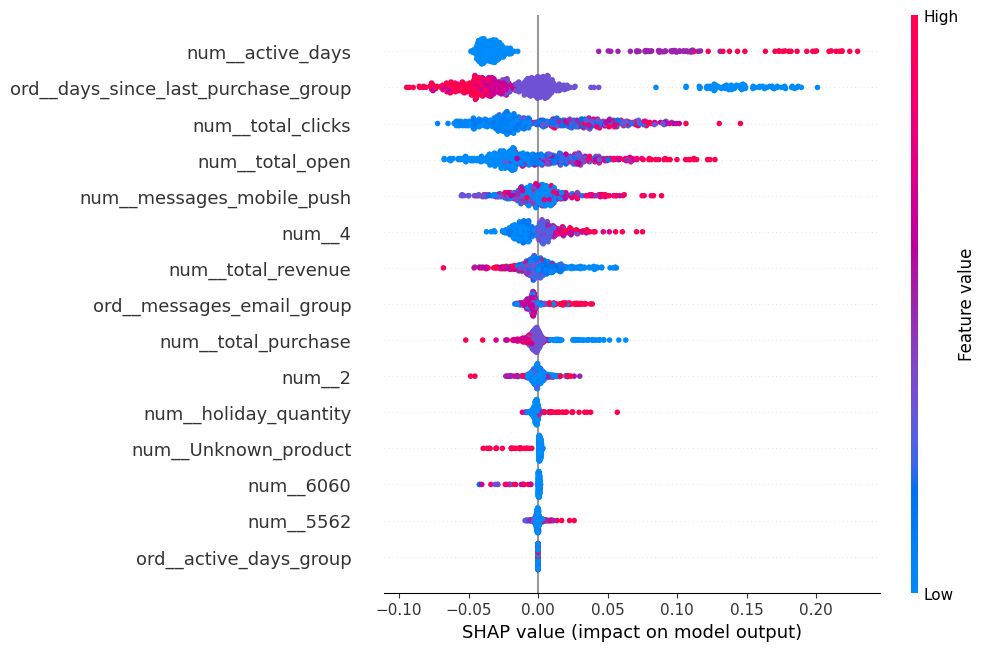

In [170]:
# Визуализирую объяснения для класса 1 с использованием beeswarm графика
shap.plots.beeswarm(shap_values[:, :, 1], max_display=20)

1. Признак `active_days_group` не влияет на модель, его можно исключить
2. На вероятность возврата покупателя влияет (топ-5 параметров):
   - рост количества активных дней (покупок)
   - снижения времени с даты последней покупки
   - рост количества кликов по письмам e-mail рассылки
   - рост количества открытых писем e-mail рассылки
   - рост полученных push уведомлений

## Убираю еще признаки исходя из анализа важности

In [171]:
# Признаки для включения в модель
features_to_model_2 = [
 # '1',
 '2',
 # '3',
 '4',
 # '5',
 '5562',
 # '5963',
 '6060',
 'Unknown_product',
 'active_days',
 # 'active_days_group',
 # 'avg_purchase',
 # 'days_since_last_purchase',
 'days_since_last_purchase_group',
 'holiday_quantity',
 # 'messages_email',
 'messages_email_group',
 'messages_mobile_push',
 # 'messages_mobile_push_group',
 # 'open_mult_send',
 'total_clicks',
 'total_open',
 'total_purchase',
 'total_revenue',
 # 'total_send',
 'total_subscribe',
 # 'unique_campaigns',
 'target'
]

In [172]:
# Отделение целевого признака
X = result_final[features_to_model_2].drop(['target'], axis=1)
y = target_binary

In [173]:
# Разделение на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [174]:
# Выделение числовых и категориальных признаков
numeric_features = X.select_dtypes(include=[np.number]).columns.to_list()
categorical_features = X.select_dtypes(exclude=[np.number, 'category']).columns.to_list()
ordinal_features = X.select_dtypes(include=['category']).columns.to_list()

Обновляю трансформер

In [175]:
# Трансформер для числовых признаков
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Заполняем пропуски модой
    ('scaler', MinMaxScaler())                   # Масштабируем
])

# Трансформер для категориальных признаков
categorical_transformer = Pipeline(steps=[
   ('imputer', SimpleImputer(strategy='constant', fill_value='unknown')),  # Заменяем пропуски на 'unknown'
   ('ohe', OneHotEncoder(handle_unknown='ignore'))
])

# Трансформер для порядковых категорий
ordinal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Заполняем пропуски модой
    ('ordinal', OrdinalEncoder())  # Кодируем по порядку
])


# Трансформер для бинарных признаков
#binary_transformer = Pipeline(steps=[
#    ('imputer', SimpleImputer(strategy='most_frequent'))  # Заполняем модой (чаще всего встречающимся значением)
#])

# Комбинация трансформеров
preprocessor = ColumnTransformer(
    transformers=[
       ('num', numeric_transformer, numeric_features),
       ('cat', categorical_transformer, categorical_features),
       ('ord', ordinal_transformer, ordinal_features) 
#        ('bin', binary_transformer, binary_features)
    ],
    remainder='passthrough'
)

**LightGBM**

In [176]:
lgbm_best_params_2, lgbm_train_time_2, lgbm_roc_auc_cv_2, best_lgbm_model_2, lgbm_predict_time_2, lgbm_roc_auc_test_2, lgbm_f1_test_2 = LightGBM(X_train, y_train, X_test, y_test)

[LightGBM] [Info] Number of positive: 769, number of negative: 39110
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1125
[LightGBM] [Info] Number of data points in the train set: 39879, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.019283 -> initscore=-3.929042
[LightGBM] [Info] Start training from score -3.929042
[LightGBM] [Info] Number of positive: 615, number of negative: 31288
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1108
[LightGBM] [Info] Number of data points in the train set: 31903, number of used features: 14
[LightGBM] [Info] [bin

**RandomForestClassifier**

In [177]:
rf_best_params_2, rf_train_time_2, rf_roc_auc_cv_2, best_rf_model_2, rf_predict_time_2, rf_roc_auc_test_2, rf_f1_test_2 = RandomForestClassif(X_train, y_train, X_test, y_test)

Random Forest Classifier - выбор гиперпараметров
Best Params: {'model__n_estimators': 100, 'model__min_samples_split': 150, 'model__max_depth': 2}
Train Time: 17.95924949645996
ROC-AUC (Cross-Validation): 0.7234842988433916
Final Test Evaluation
Predict Time: 0.04687619209289551
ROC-AUC (Test): 0.7289328296515989
f1 (Test): 0.07957559681697612


**LogisticRegression**

In [178]:
logreg_best_params_2, logreg_train_time_2, logreg_roc_auc_cv_2, best_logreg_model_2, logreg_predict_time_2, logreg_roc_auc_test_2, logreg_f1_test_2 = LogReg(X_train, y_train, X_test, y_test)

Logistic Regression - выбор гиперпараметров
Best Params: {'model__penalty': 'l1', 'model__C': 10}
Train Time: 2.6433255672454834
ROC-AUC (Cross-Validation): 0.7298720555142865
Final Test Evaluation
Predict Time: 0.01563549041748047
ROC-AUC (Test): 0.7398150397150065
f1 (Test): 0.08183632734530938


**CatBoost**

In [179]:
catboost_best_params_2, catboost_train_time_2, catboost_roc_auc_cv_2, best_catboost_model_2, catboost_predict_time_2, catboost_roc_auc_test_2, catboost_f1_test_2 = CatBoostModel(X_train, y_train, X_test, y_test)

CatBoost - выбор гиперпараметров
Best Params: {'model__learning_rate': 0.01, 'model__iterations': 200, 'model__depth': 4}
Train Time: 62.04346179962158
ROC-AUC (Cross-Validation): 0.734878320124684
Final Test Evaluation
Predict Time: 0.03123760223388672
ROC-AUC (Test): 0.744010256869162
f1 (Test): 0.08199521694567817


## Анализ моделей

### Результаты моделирования

In [185]:
models_summary_2 = results_summary(
                 lgbm_best_params_2, rf_best_params_2, logreg_best_params_2, catboost_best_params_2,
                 lgbm_train_time_2, rf_train_time_2, logreg_train_time_2, catboost_train_time_2,
                 lgbm_roc_auc_cv_2, rf_roc_auc_cv_2, logreg_roc_auc_cv_2, catboost_roc_auc_cv_2,
                 lgbm_predict_time_2, rf_predict_time_2, logreg_predict_time_2, catboost_predict_time_2,
                 lgbm_roc_auc_test_2, rf_roc_auc_test_2, logreg_roc_auc_test_2, catboost_roc_auc_test_2,
                 lgbm_f1_test_2, rf_f1_test_2, logreg_f1_test_2, catboost_f1_test_2
                )

,Model,Best Params,Train Time,ROC-AUC (Cross-Validation),Predict Time (Test),ROC-AUC (Test),f1 (Test)
0,LightGBM,"{'model__objective': 'binary', 'model__num_leaves': 31, 'model__n_estimators': 100, 'model__learning_rate': 0.01, 'model__is_unbalance': True}",11.605182,0.718281,0.031246,0.747890,0.140152
1,Random Forest,"{'model__n_estimators': 100, 'model__min_samples_split': 150, 'model__max_depth': 2}",17.959249,0.723484,0.046876,0.728933,0.079576
2,LogisticRegression,"{'model__penalty': 'l1', 'model__C': 10}",2.643326,0.729872,0.015635,0.739815,0.081836
3,CatBoost,"{'model__learning_rate': 0.01, 'model__iterations': 200, 'model__depth': 4}",62.043462,0.734878,0.031238,0.744010,0.081995


## Анализ всех моделей

### Результаты моделирования

In [186]:
models_summary_1

,Model,Best Params,Train Time,ROC-AUC (Cross-Validation),Predict Time (Test),ROC-AUC (Test),f1 (Test)
0,LightGBM,"{'model__objective': 'binary', 'model__num_leaves': 31, 'model__n_estimators': 100, 'model__learning_rate': 0.01, 'model__is_unbalance': True}",14.578971,0.717683,0.054978,0.747890,0.140152
1,Random Forest,"{'model__n_estimators': 100, 'model__min_samples_split': 150, 'model__max_depth': 15}",19.584011,0.729164,0.141216,0.737005,0.132554
2,LogisticRegression,"{'model__penalty': 'l2', 'model__C': 10}",2.988976,0.729393,0.021826,0.740045,0.082557
3,CatBoost,"{'model__learning_rate': 0.1, 'model__iterations': 200, 'model__depth': 2}",64.722466,0.733506,0.041072,0.755356,0.087669


In [187]:
models_summary_2

,Model,Best Params,Train Time,ROC-AUC (Cross-Validation),Predict Time (Test),ROC-AUC (Test),f1 (Test)
0,LightGBM,"{'model__objective': 'binary', 'model__num_leaves': 31, 'model__n_estimators': 100, 'model__learning_rate': 0.01, 'model__is_unbalance': True}",11.605182,0.718281,0.031246,0.747890,0.140152
1,Random Forest,"{'model__n_estimators': 100, 'model__min_samples_split': 150, 'model__max_depth': 2}",17.959249,0.723484,0.046876,0.728933,0.079576
2,LogisticRegression,"{'model__penalty': 'l1', 'model__C': 10}",2.643326,0.729872,0.015635,0.739815,0.081836
3,CatBoost,"{'model__learning_rate': 0.01, 'model__iterations': 200, 'model__depth': 4}",62.043462,0.734878,0.031238,0.744010,0.081995


Лучше всех справилась LightGBM (ROC-AUC чуть ниже чем у CatBoost, но зато f1 в два раза больше) - возьму модель с меньшим набором признаков, так как она быстрее обучается и расчитывает прогноз

### Матрица ошибок и f1 для лучшей модели

In [195]:
best_model = best_lgbm_model_2

F1 Score: 0.14015151515151514


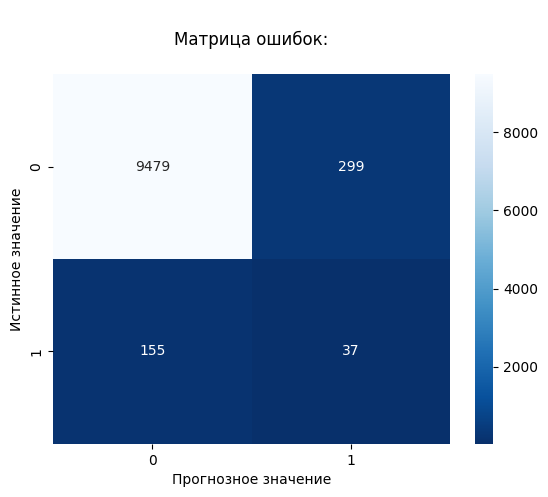

In [196]:
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Вероятности для класса 1

cm = confusion_matrix(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("F1 Score:", f1)
# Вывожу матрицу ошибок (confusion matrix)
plt.title("\nМатрица ошибок:\n")
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r')
plt.ylabel('Истинное значение')
plt.xlabel('Прогнозное значение'); 

Порог, при котором False Positives = 0: 0.5620000000000004

Метрики при пороге, когда False Positives = 0:
Accuracy: 0.9807422266800401
Precision: 0.0
Recall: 0.0
F1 Score: 0.0
ROC AUC: 0.7478898739517283


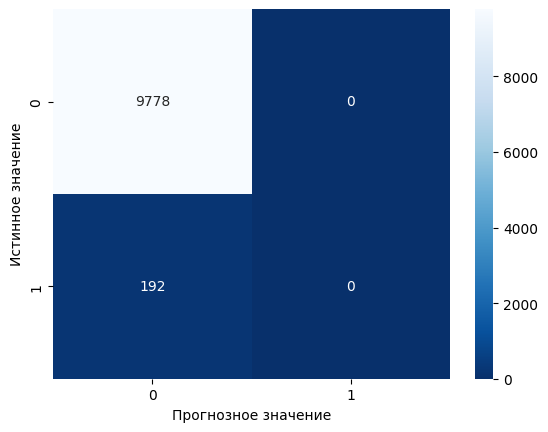

In [197]:
# Определяю порог, при котором ложно положительные ошибки будут равны нулю
threshold = 0.0
while True:
    y_pred_adjusted = (y_pred_proba >= threshold).astype(int)
    fp = confusion_matrix(y_test, y_pred_adjusted)[0, 1]  # False Positives
    if fp == 0:
        break
    threshold += 0.001  # Шаг изменения порога можно изменить
print("Порог, при котором False Positives = 0:", threshold)

# Вычисляю метрики для найденного порога
y_pred_final = (y_pred_proba >= threshold).astype(int)
cm_final = confusion_matrix(y_test, y_pred_final)
accuracy_final = accuracy_score(y_test, y_pred_final)
precision_final = precision_score(y_test, y_pred_final)
recall_final = recall_score(y_test, y_pred_final)
f1_final = f1_score(y_test, y_pred_final)
roc_auc_final = roc_auc_score(y_test, y_pred_proba)

# Вывожу значения метрик
print("\nМетрики при пороге, когда False Positives = 0:")
print(f"Accuracy: {accuracy_final}")
print(f"Precision: {precision_final}")
print(f"Recall: {recall_final}")
print(f"F1 Score: {f1_final}")
print(f"ROC AUC: {roc_auc_final}")

# Вывожу матрицу ошибок
sns.heatmap(cm_final, annot=True, fmt='d', cmap='Blues_r')
plt.ylabel('Истинное значение')
plt.xlabel('Прогнозное значение')
plt.show()

## Выводы по проекту

1. Задача: построить модель прогноза пользователей, которые готовы совершить покупку в ближайшее время. Данные - выгрузка заказов, несколько выгрузок рассылок (май 22 - февраль 24). Для заказчика важна метрика ROC-AUC.
2. Данные было необходимо агрегировать по покупателям. Добавил несколько признаков (группы вместо значений), для усиления влияния на целевой признак.
3. Классы сильно несбалансированы, на первый класс приходиться менее 0.02% данных.
4. Обучение проводилось для 3х моделей - LightGBM, RandomForestRegressor, LogicticRegression. Поиск лучшей модели производился с использованием  - RandomizedSearchCV (выбор по сетке параметров по случайным комбинациям с кросс валидацией).
5. На вероятность возврата покупателя влияет (топ-5 параметров):
   - рост количества активных дней (покупок)
   - снижения времени с даты последней покупки
   - рост количества кликов по письмам e-mail рассылки
   - рост количества открытых писем e-mail рассылки
   - рост полученных push уведомлений
6. Лучше всех справилась LightGBM с уменьшенным набором признаков (по результатам SHAP анализа важности):

In [198]:
models_summary_2.head(1)

,Model,Best Params,Train Time,ROC-AUC (Cross-Validation),Predict Time (Test),ROC-AUC (Test),f1 (Test)
0,LightGBM,"{'model__objective': 'binary', 'model__num_leaves': 31, 'model__n_estimators': 100, 'model__learning_rate': 0.01, 'model__is_unbalance': True}",11.605182,0.718281,0.031246,0.74789,0.140152


7.  Увеличить точность выявления тех, кто совершит покупку в теч 90 дней не получится - в это случае модель вообще перестает определять таких покупателей
8.  Нужно еще поискать признаков для лучшей сепарации между теми кто покупал и не покупал.
9.  В целом видимо у этого интернет магазина есть сложности с удержанием клиентов и нужны программы лояльности.